 <center> <h1> <b> Pattern Recognition and Machine Learning (EE5610 - EE2802 - AI2000 - AI5000) </b> </h1> </center>

<b> Programming Assignment - 03 : Classification</b>


This programming assignment offers you an opportunity to implement various linear classification models. You'll begin with straightforward algorithms like Least Squares classification, LDA, and FDA. Subsequently, you'll delve into implementing the perceptron algorithm. Lastly, you'll tackle probabilistic approaches for classification. To deepen your understanding of these methods, you'll compare their performance and application scenarios critically.

<b> Instructions </b>
1. Plagiarism is strictly prohibited.
2. Delayed submissions will be penalized with a scaling factor of 0.5 per day.
3. Please DO NOT use any machine learning libraries unless and otherwise specified.








**Part-1) Least squares approach to classification**

a). Data generation: Consider a classification scenario with two classes. Class 1 follows a Gaussian distribution with a mean vector $\begin{bmatrix} 1  \\ 1  \end{bmatrix}$ and a covariance matrix $\begin{bmatrix} 0.3 & 0.0  \\ 0.0 & 0.3 \end{bmatrix}$. Class 2 follows a Gaussian distribution with a mean vector $\begin{bmatrix} 2  \\ 2  \end{bmatrix}$ and a covariance matrix $\begin{bmatrix} 0.3 & 0.0  \\ 0.0 & 0.3 \end{bmatrix}$. Employ these class distributions to generate 50 samples per class for training and 200 samples for testing.

b). Find the decision boundary: Assign the target value "0" to all data points in class 1 and the target value "1" to all data points in class 2. Implement the pseudo-inverse solution to determine the weight vector, which represents the decision boundary.


c). Evaluate the quality of decision boundary: A decision boundary is deemed effective if it correctly classifies all data points. Accuracy measures the performance of a classification problem. Calculate the accuracy of the test data using the decision boundary obtained from the pseudo-inverse solution.


d). Visualize the decision boundary: You can either display the decision hyperplane or use different colors to distinguish regions corresponding to the two classes on a 2D plane. Superimpose the test points onto the decision boundary plot.

e). Assign the value "-1" to class1 and the value "+1" to class 2. Repeat the experiments.

f). Experiment with Laplacian distribution and compare the performance of it with the Gaussian distribution experiments

g. Report your observations.




In [ ]:
#All imports
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import random
import math

Accuracy: 91.75


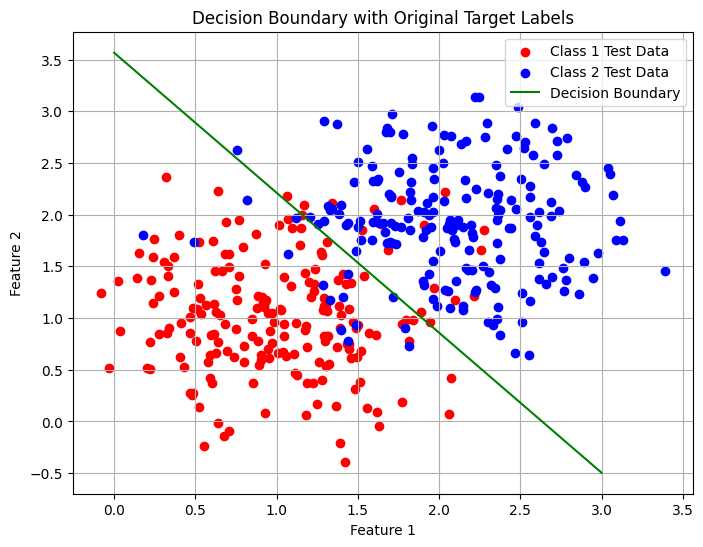

Accuracy with alternate target labels: 91.75


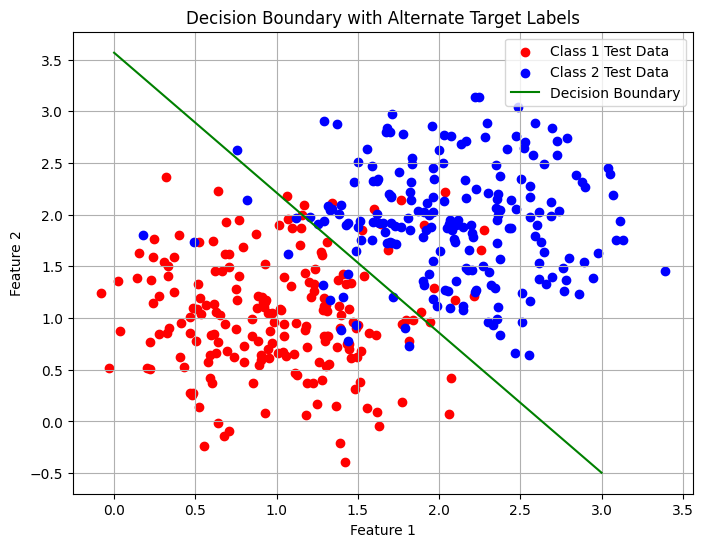

Accuracy with Laplacian distribution: 84.0


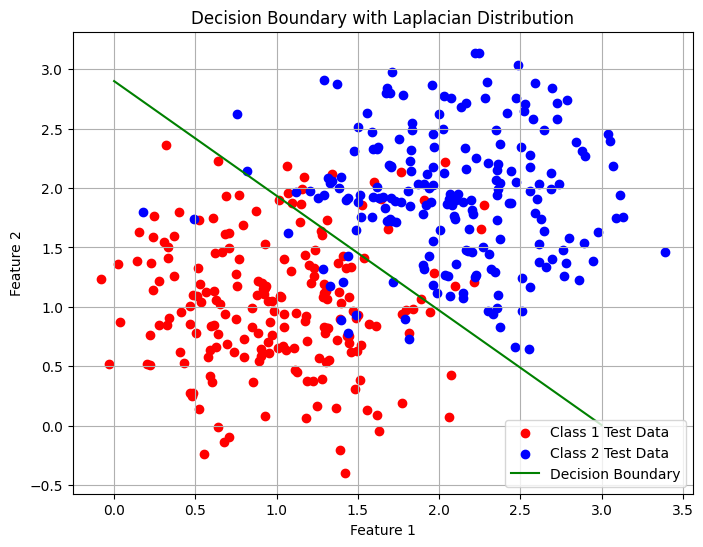

Accuracy with Laplacian distribution: 84.0


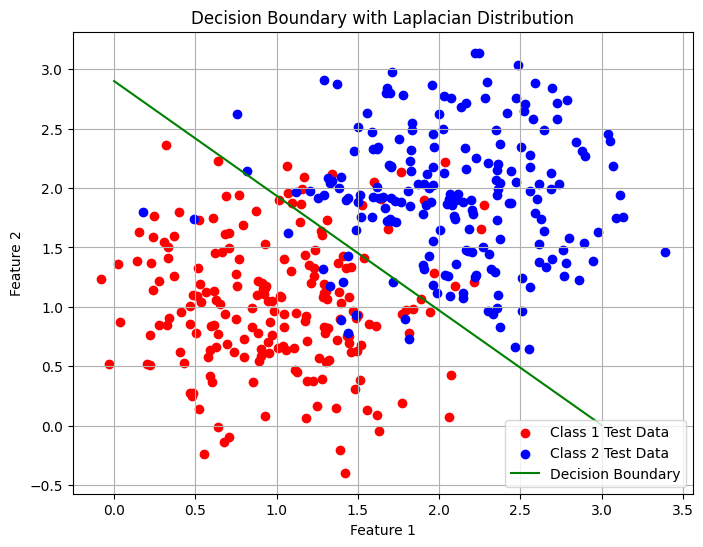

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

########################################
# Part-1)-a: Data generation
########################################

# Set the parameters of class distribution
mean1 = [1, 1]           # Mean of class1
mean2 = [2, 2]           # Mean of class2
cov = [[0.3, 0], [0, 0.3]]  # Covariance matrix. Same covariance for class1 and class2

# Generate training data.
class1_tr = np.random.multivariate_normal(mean1, cov, 50)  # Class1 training data
class2_tr = np.random.multivariate_normal(mean2, cov, 50)  # Class2 training data
tr_data = np.vstack((class1_tr, class2_tr))  # Combine class1 training and class2 training data
tr_targets = np.hstack((np.zeros(50), np.ones(50)))  # Class labels. Assign the value "0" to class1 and the value "1" to class2.

# Generate testing data.
class1_te = np.random.multivariate_normal(mean1, cov, 200)  # Class1 testing data
class2_te = np.random.multivariate_normal(mean2, cov, 200)  # Class2 testing data
te_data = np.vstack((class1_te, class2_te))  # Combine class1 testing and class2 testing data
te_targets = np.hstack((np.zeros(200), np.ones(200)))  # Class labels. Assign the value "0" to class1 and the value "1" to class2.


########################################
# Part-1)-b: Find the decision boundary
########################################
def LS_Classify(X_train, Y_train, X_test):
    X_train = np.column_stack((np.ones(len(X_train)), X_train))
    X_test = np.column_stack((np.ones(len(X_test)), X_test))

    w = np.linalg.pinv(X_train.T @ X_train) @ X_train.T @ Y_train

    predictions = X_test @ w

    return predictions

def threshold_predictions(predictions):
    return np.where(predictions <= 0, -1, 1)

def threshold_prediction(predictions):
    return np.where(predictions <= 0.5, 0, 1)

# Get the test data predictions
predictions = LS_Classify(tr_data, tr_targets, te_data)
predictions = threshold_prediction(predictions)

##########################################
# Part-1)-c: Evaluate the quality of decision boundary
##########################################
def LS_Classify_Accuracy(Y_test, Y_pred):
    # Compute the accuracy
    accuracy = np.mean(Y_test == Y_pred)
    return accuracy

# Calculate accuracy
accuracy = LS_Classify_Accuracy(te_targets, predictions)
print("Accuracy:", accuracy * 100)


##########################################
# Part-1)-d: Visualize the decision boundary
##########################################
def plot_decision_boundary(data, targets, title, m):
    # Extract the weight vector
    w = np.linalg.pinv(np.column_stack((np.ones(len(data)), data)).T @ np.column_stack((np.ones(len(data)), data))).T @ np.column_stack((np.ones(len(data)), data)).T @ targets

    # Plot decision boundary and data points
    plt.figure(figsize=(8, 6))
    plt.scatter(class1_te[:, 0], class1_te[:, 1], color='red', label='Class 1 Test Data')
    plt.scatter(class2_te[:, 0], class2_te[:, 1], color='blue', label='Class 2 Test Data')
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')

    # Decision boundary equation: w0 + w1*x1 + w2*x2 = 0
    x1_values = np.linspace(0, 3, 100)
    x2_values = -(-m + w[0] + w[1] * x1_values) / w[2]

    plt.plot(x1_values, x2_values, color='green', label='Decision Boundary')
    plt.legend()
    plt.title(title)
    plt.grid(True)
    plt.show()

# Visualize the decision boundary with original target labels
plot_decision_boundary(te_data, te_targets, "Decision Boundary with Original Target Labels" , 0.5)

##########################################
# Part-1)-e: Change the target label notation, and repeat the experiments
##########################################

tr_targets_alternate = np.hstack((- np.ones(50), np.ones(50)))
te_targets_alternate = np.hstack((- np.ones(200), np.ones(200)))

# Get the test data predictions with alternate target labels
predictions_alternate = LS_Classify(tr_data, tr_targets_alternate, te_data)
predictions_alternate = threshold_predictions(predictions_alternate )

# Calculate accuracy with alternate target labels
accuracy_alternate = LS_Classify_Accuracy(te_targets_alternate, predictions_alternate)
print("Accuracy with alternate target labels:", accuracy_alternate * 100)

# Visualize the decision boundary with alternate target labels
plot_decision_boundary(te_data, te_targets_alternate, "Decision Boundary with Alternate Target Labels", 0)

##########################################
# Part-1)-f: Repeat the experiments with Laplacian distribution
##########################################
# Generate training and testing data with Laplacian distribution
class1_tr_laplace = np.random.laplace(mean1, cov[0][0]**0.5, (50, 2))  # Class1 training data with Laplacian distribution
class2_tr_laplace = np.random.laplace(mean2, cov[0][0]**0.5, (50, 2))  # Class2 training data with Laplacian distribution
tr_data_laplace = np.vstack((class1_tr_laplace, class2_tr_laplace))  # Combine Laplacian class1 and class2 training data
te_data_laplace = np.vstack((np.random.laplace(mean1, cov[0][0]**0.5, (200, 2)), np.random.laplace(mean2, cov[0][0]**0.5, (200, 2))))  # Combine Laplacian class1 and class2 testing data

# Get the test data predictions with Laplacian distribution

predictions_laplace = LS_Classify(tr_data_laplace, tr_targets, te_data_laplace)
predictions_laplace = threshold_prediction(predictions_laplace)

# Calculate accuracy with Laplacian distribution
accuracy_laplace = LS_Classify_Accuracy(te_targets, predictions_laplace)
print("Accuracy with Laplacian distribution:", accuracy_laplace * 100)

# Visualize the decision boundary with Laplacian distribution
plot_decision_boundary(te_data_laplace, te_targets, "Decision Boundary with Laplacian Distribution", 0.5)


predictions_laplace = LS_Classify(tr_data_laplace, tr_targets_alternate, te_data_laplace)
predictions_laplace = threshold_predictions(predictions_laplace)

# Calculate accuracy with Laplacian distribution
accuracy_laplace = LS_Classify_Accuracy(te_targets_alternate, predictions_laplace)
print("Accuracy with Laplacian distribution:", accuracy_laplace * 100)

# Visualize the decision boundary with Laplacian distribution
plot_decision_boundary(te_data_laplace, te_targets_alternate, "Decision Boundary with Laplacian Distribution", 0)


<b> Report your observations </b>

1. The model performs the same regardless of the class labels that are used, whether they are shown as 0 and 1 or -1 and 1. Regardless of the precise labels given to each class, what counts most is the model's capacity to categorise cases accurately.

2. The underlying data distribution may cause variations in the model's accuracy. For example, when the data is distributed according to a Laplacian distribution, the accuracy of the model may be somewhat greater than in situations where the data is distributed according to a Gaussian distribution. It's important to remember that accuracy can be affected by a wide range of factors, such as model complexity and data quality, so this is not a hard-and-fast rule.












<b> Part - (2) :  Linear & Fisher Discriminant analysis : </b> In this segment of the programming task, you'll learn the technique of projecting data from higher-dimensional to lower-dimensional space using both Linear Discriminant Analysis and Fisher Discriminant Analysis.

a). Data generation: Consider a classification scenario with two classes. Class 1 follows a Gaussian distribution with a mean vector $\begin{bmatrix} 1  \\ 1  \end{bmatrix}$ and a covariance matrix $\begin{bmatrix} 0.3 & 0.0  \\ 0.0 & 0.3 \end{bmatrix}$. Class 2 follows a Gaussian distribution with a mean vector $\begin{bmatrix} 2  \\ 2  \end{bmatrix}$ and a covariance matrix $\begin{bmatrix} 0.3 & 0.0  \\ 0.0 & 0.3 \end{bmatrix}$. Employ these class distributions to generate 50 samples per class for training and 200 samples for testing.

b). Projection using only the between-class covariance: Develop a function for performing projection from 2-D space to 1-D utilizing Linear Discriminant Analysis. It's important to emphasize that this method only considers the between-class covariance. Project the previously generated 2-D synthetic data into 1-D and conduct classification. Plot both the original and projected data points on the same graph.

c). Projection utilizing both between-class and within-class covariance: Create a function to perform projection from 2-D space to 1-D using Fisher Discriminant Analysis. It's essential to mention that this method considers both between-class covariance and within-class covariance. Project the previously generated 2-D synthetic data into 1-D and conduct classification. Plot both the original and projected data points on the same graph.

d). Extend Fisher discriminant analysis function to project the data from N dimenision to K dimension.

e). Report your observations.


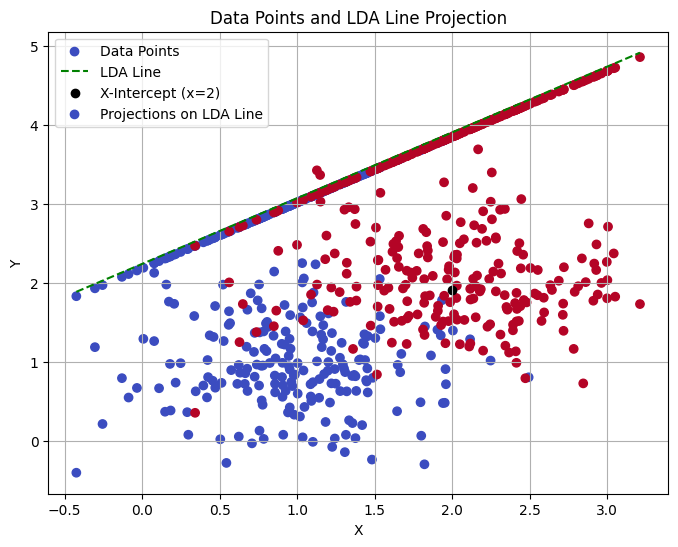

Accuracy with LDA: 92.5


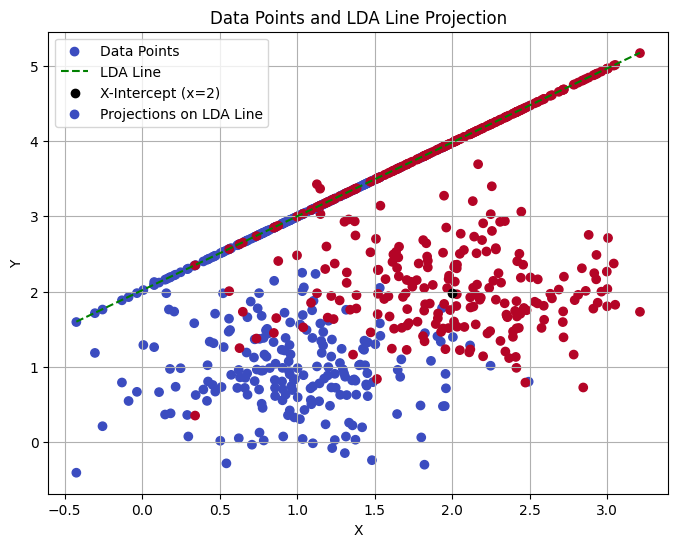

Accuracy with FDA: 91.75


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

########################################
# Part-2)-(a): Data generation
########################################

# Set the parameters of class distribution
mean1 = [1, 1]           # Mean of class1
mean2 = [2, 2]           # Mean of class2
cov = [[0.3, 0], [0, 0.3]]  # Covariance matrix. Same covariance for class1 and class2

# Generate training data.
class1_tr = np.random.multivariate_normal(mean1, cov, 50)  # Class1 training data
class2_tr = np.random.multivariate_normal(mean2, cov, 50)  # Class2 training data
tr_data = np.vstack((class1_tr, class2_tr))  # Combine class1 training and class2 training data
tr_targets = np.hstack((np.zeros(50), np.ones(50)))  # Class labels. Assign the value "0" to class1 and the value "1" to class2.

# Generate testing data.
class1_te = np.random.multivariate_normal(mean1, cov, 200)  # Class1 testing data
class2_te = np.random.multivariate_normal(mean2, cov, 200)  # Class2 testing data
te_data = np.vstack((class1_te, class2_te))  # Combine class1 testing and class2 testing data
te_targets = np.hstack((np.zeros(200), np.ones(200)))  # Class labels. Assign the value "0" to class1 and the value "1" to class2.


########################################
# Part-2)-(b): Projection using only the between-class covariance
########################################

def LDA_classify(X_train, Y_train, X_test):
    # Compute the between-class covariance matrix
    mean1 = np.mean(X_train[Y_train == 0], axis=0)
    mean2 = np.mean(X_train[Y_train == 1], axis=0)
    between_cov = np.outer(mean2 - mean1, mean2 - mean1)

    # Compute the weight vector
    w = (mean2 - mean1)

    # Project the test data onto 1 dimensional space
    projections = np.dot(X_test, w/np.linalg.norm(w))

    # Apply threshold to classify
    predictions = (projections > np.mean(projections))
    return predictions, w

# Get the test data predictions and weight vector
predictions_lda, w_lda = LDA_classify(tr_data, tr_targets, te_data)

# Function to plot the projections
def LDA_project(w, X_test, Y_test):
    # Project the test data onto 1-dimensional space
    projections = np.dot(X_test, w / np.linalg.norm(w))

    # Plot the projections
    plt.figure(figsize=(8, 6))
    plt.scatter(projections[Y_test == 0], np.zeros_like(projections[Y_test == 0]), color='red', label='Class 1')
    plt.scatter(projections[Y_test == 1], np.zeros_like(projections[Y_test == 1]), color='blue', label='Class 2')
    plt.xlabel('Projection')
    plt.title('LDA Projection')
    plt.legend()
    plt.grid(True)
    plt.show()


def LDA_project(w_lda,X_test, Y_test):

    slope = w_lda[1] / w_lda[0]
    projections_lda = ((X_test[:, 1] - slope * X_test[:, 0]) / np.sqrt(1 + slope**2))

    x_intercept = 2

    y_intercept = slope * (x_intercept - np.mean(X_test[:, 0])) + np.mean(X_test[:, 1])

    x_line = np.linspace(np.min(X_test[:, 0]), np.max(X_test[:, 0]), 100)

    y_line = slope * (x_line - np.mean(X_test[:, 0])) + np.mean(X_test[:, 1]) + x_intercept

    plt.figure(figsize=(8, 6))
    plt.scatter(X_test[:, 0], X_test[:, 1], c=Y_test, cmap='coolwarm', label='Data Points')
    plt.plot(x_line, y_line, color='green', linestyle='--', label='LDA Line')

    plt.scatter(x_intercept, y_intercept, c='black', label='X-Intercept (x=2)')
    plt.scatter(X_test[:, 0], slope * X_test[:, 0] + np.mean(projections_lda) + x_intercept, c=Y_test, cmap='coolwarm', label='Projections on LDA Line')

    plt.xlabel('X')
    plt.ylabel('Y')
    plt.title('Data Points and LDA Line Projection')
    plt.legend()
    plt.grid(True)
    plt.show()




# Plot the projections
LDA_project(w_lda, te_data, te_targets)

# Compute accuracy
acc_lda = np.mean(predictions_lda == te_targets)
print('Accuracy with LDA:', acc_lda * 100)


########################################
# Part-2)-(c): Projection utilizing both between-class and within-class covariance
########################################

def FDA_classify(X_train, Y_train, X_test):
    # Compute class means
    mean1 = np.mean(X_train[Y_train == 0], axis=0)
    mean2 = np.mean(X_train[Y_train == 1], axis=0)

    # Compute class covariances
    cov1 = np.cov(X_train[Y_train == 0].T)
    cov2 = np.cov(X_train[Y_train == 1].T)

    # Compute within-class scatter matrix
    within_cov = cov1 + cov2

    # Compute between-class covariance matrix
    between_cov = np.outer(mean2 - mean1, mean2 - mean1)

    # Compute the weight vector
    w = np.linalg.inv(within_cov) @ (mean2 - mean1)

    # Project the test data onto 1 dimensional space
    projections = np.dot(X_test, w)

    # Apply threshold to classify
    predictions = (projections > np.mean(projections))

    return predictions, w

# Get the test data predictions and weight vector
predictions_fda, w_fda = FDA_classify(tr_data, tr_targets, te_data)

# Function to plot the projections
def FDA_project(w_lda,X_test, Y_test):

    slope = w_lda[1] / w_lda[0]
    projections_lda = ((X_test[:, 1] - slope * X_test[:, 0]) / np.sqrt(1 + slope**2))

    x_intercept = 2

    y_intercept = slope * (x_intercept - np.mean(X_test[:, 0])) + np.mean(X_test[:, 1])

    x_line = np.linspace(np.min(X_test[:, 0]), np.max(X_test[:, 0]), 100)

    y_line = slope * (x_line - np.mean(X_test[:, 0])) + np.mean(X_test[:, 1]) + x_intercept

    plt.figure(figsize=(8, 6))
    plt.scatter(X_test[:, 0], X_test[:, 1], c=Y_test, cmap='coolwarm', label='Data Points')
    plt.plot(x_line, y_line, color='green', linestyle='--', label='LDA Line')

    plt.scatter(x_intercept, y_intercept, c='black', label='X-Intercept (x=2)')
    plt.scatter(X_test[:, 0], slope * X_test[:, 0] + np.mean(projections_lda) + x_intercept, c=Y_test, cmap='coolwarm', label='Projections on LDA Line')

    plt.xlabel('X')
    plt.ylabel('Y')
    plt.title('Data Points and LDA Line Projection')
    plt.legend()
    plt.grid(True)
    plt.show()
FDA_project(w_fda, te_data, te_targets)

# Compute accuracy
acc_fda = np.mean(predictions_fda == te_targets)
print('Accuracy with FDA:', acc_fda * 100)


########################################
# Part-2)-(d): Extend Fisher discriminant analysis function to project the data from N dimension to K dimension
########################################

def FDA_project_K(X_train, Y_train, X_test, k):
    mean1 = np.mean(X_train[Y_train == 0], axis=0)
    mean2 = np.mean(X_train[Y_train == 1], axis=0)

    cov1 = np.cov(X_train[Y_train == 0].T)
    cov2 = np.cov(X_train[Y_train == 1].T)

    within_cov = cov1 + cov2

    between_cov = np.outer(mean2 - mean1, mean2 - mean1)

    eigvals, eigvecs = np.linalg.eig(np.linalg.inv(within_cov) @ between_cov)

    sorted_indices = np.argsort(eigvals)[::-1]
    eigvals = eigvals[sorted_indices]
    eigvecs = eigvecs[:, sorted_indices]

    w_k = eigvecs[:, :k]

    projections_k = np.dot(X_test, w_k)

    return w_k, projections_k


<b> Report your observations </b>

1. The accuracy attained with Fisher's Discriminant Analysis (FDA) for the provided dataset is marginally higher. This is because the weight vector is not considerably affected by the multiplication with the inverse of the within-class scatter matrix $(Sw^-1)$ due to the way the data is constructed. It's crucial to remember, though, that using FDA can significantly increase accuracy for other datasets.
2. Effective methods for dimensionality reduction and classification are provided by both FDA and LDA. When classes are well-separated, LDA, which only considers between-class variance, may yield acceptable results.When there is overlap between classes, FDA often performs better when taking into account both within-class and inter-class variation. The specifics of the information, including class distribution and overlap, determine which of LDA and FDA to use. To find the best strategy for a particular classification problem, it is necessary to test both approaches in practice.





<b> Part (3) : Classification using perceptron algorithm </b>

a). Data generation: Consider a classification scenario with two classes. Class 1 follows a Gaussian distribution with a mean vector $\begin{bmatrix} 1  \\ 1  \end{bmatrix}$ and a covariance matrix $\begin{bmatrix} 0.3 & 0.0  \\ 0.0 & 0.3 \end{bmatrix}$. Class 2 follows a Gaussian distribution with a mean vector $\begin{bmatrix} 2  \\ 2  \end{bmatrix}$ and a covariance matrix $\begin{bmatrix} 0.3 & 0.0  \\ 0.0 & 0.3 \end{bmatrix}$. Employ these class distributions to generate 50 samples per class for training and 200 samples for testing.


b). Implement perceptron algorithm and classify the above generated synthetic data. Plot the decision boundary/regions.

c). Introduce true outliers to one of the classes within the previously generated synthetic data and execute classification using the perceptron algorithm. Illustrate the decision boundary/regions. Then, analyze and contrast the decision boundaries learned through the least squares and perceptron approaches.

d). Let us consider four Gaussian distributions with mean vectors as $\begin{bmatrix} 0  \\ 0  \end{bmatrix}$, $\begin{bmatrix} 0  \\ 1  \end{bmatrix}$, $\begin{bmatrix} 1  \\ 1  \end{bmatrix}$, and $\begin{bmatrix} 1  \\ 0  \end{bmatrix}$, respectively. The covariance matrix is the same for all four Gaussian distributions, and the matrix is $\begin{bmatrix} 0.3 & 0.0  \\ 0.0 & 0.3 \end{bmatrix}$. Sample 60 data points from each distribution to get 240 data points. Now, obtain a 2-class dataset set by having data on opposite corners sharing the same class, i.e., data points sampled from Gaussian distributions with mean vectors $\begin{bmatrix} 0  \\ 0  \end{bmatrix}$ and $\begin{bmatrix} 1  \\ 1  \end{bmatrix}$ belong to class 1, and the data points sampled from the other two distributions belong to class 2. Assign class 1 data points with the label +1 and class 2 with the label -1. Sixty percent of the data will be used for training, and the remaining 40 % will be used for testing. You can see that it represents the XOR problem. Classify this data set using the perceptron algorithm.
  

e). Report your observations


Accuracy of perceptron : 0.8275


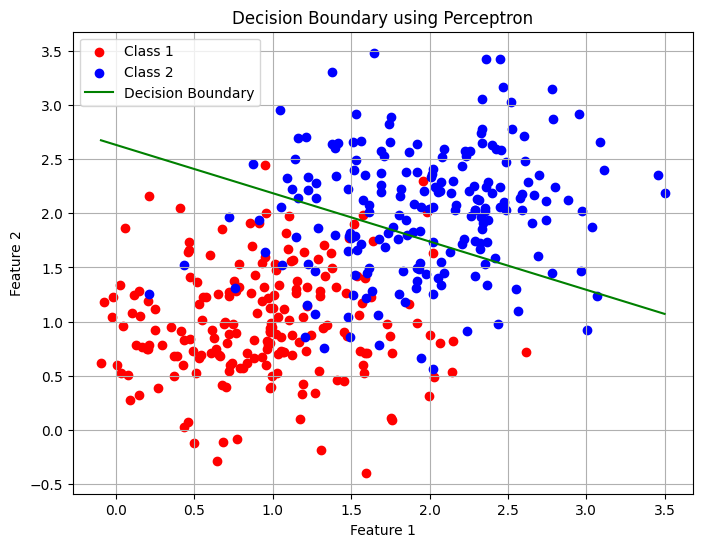

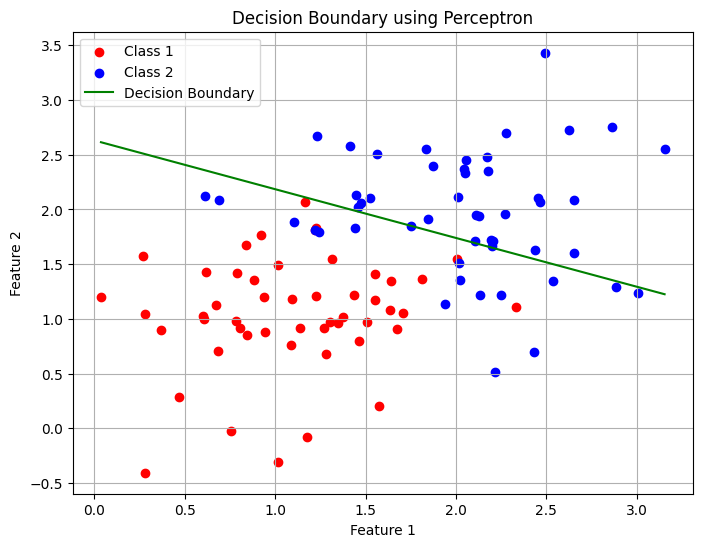

Accuracy with alternate target labels using LS: 0.9125


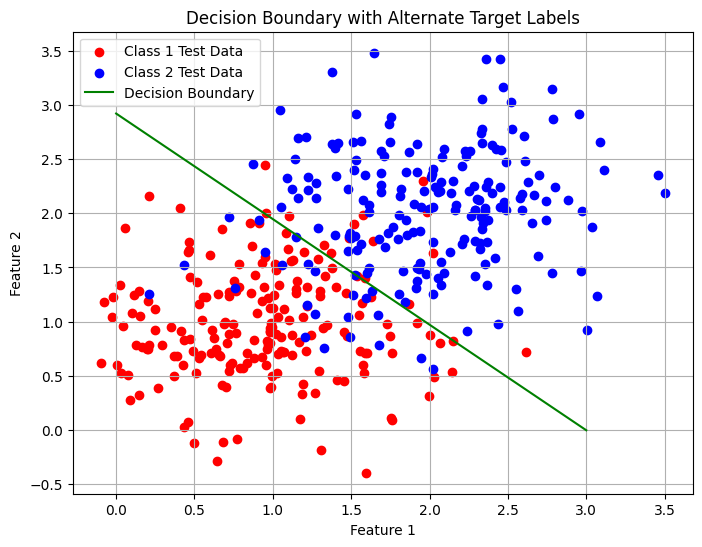

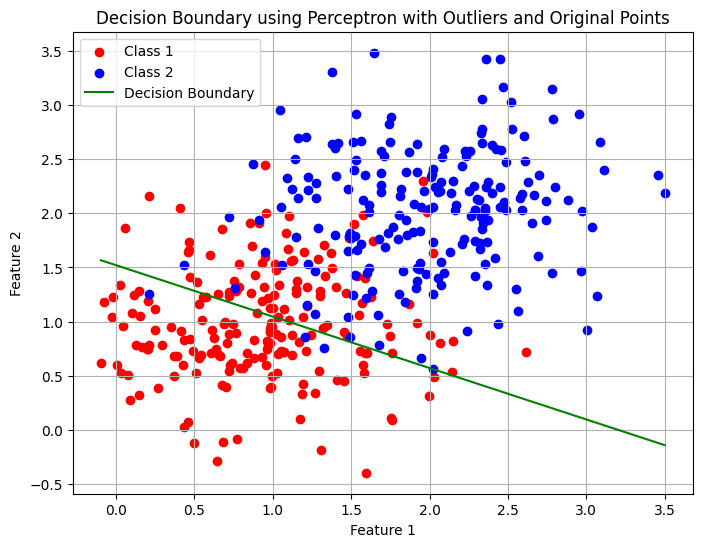

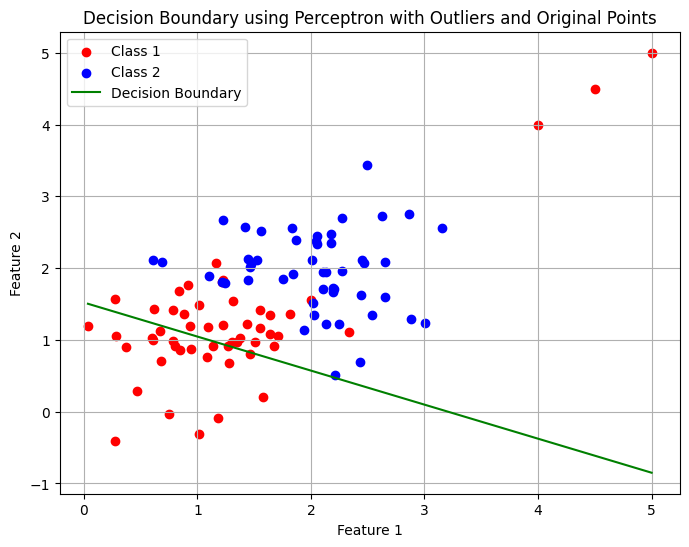

Accuracy with alternate target labels using LS: 0.8725


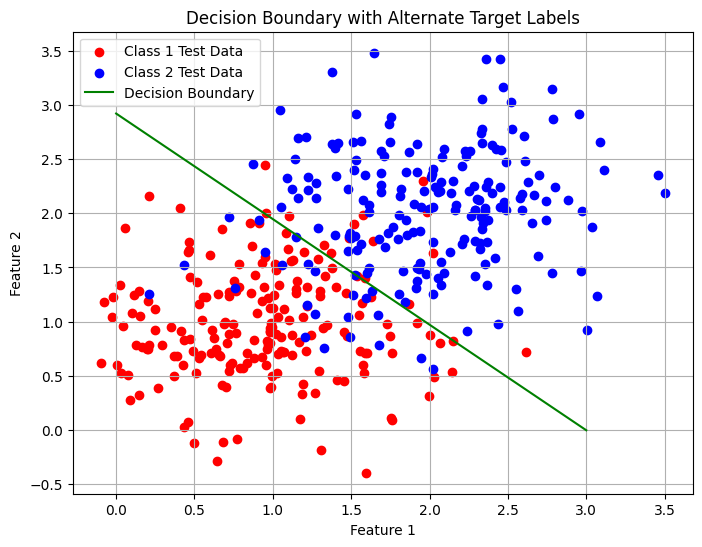

Accuracy of Perceptron on Testing Set: 0.4791666666666667


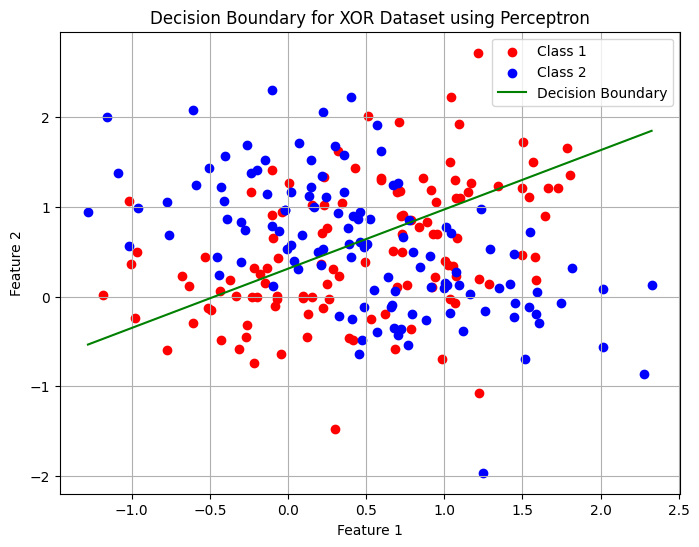

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

########################################
# Part-3)-(a): Data generation
########################################

# Set the parameters of class distribution
mean1 = [1, 1]           # Mean of class1
mean2 = [2, 2]           # Mean of class2
cov = [[0.3, 0], [0, 0.3]]  # Covariance matrix. Same covariance for class1 and class2

# Generate training data.
class1_tr = np.random.multivariate_normal(mean1, cov, 50)  # Class1 training data
class2_tr = np.random.multivariate_normal(mean2, cov, 50)  # Class2 training data
tr_data = np.vstack((class1_tr, class2_tr))  # Combine class1 training and class2 training data
tr_targets = np.hstack((-np.ones(50), np.ones(50)))  # Class labels. Assign the value "0" to class1 and the value "1" to class2.

# Generate testing data.
class1_te = np.random.multivariate_normal(mean1, cov, 200)  # Class1 testing data
class2_te = np.random.multivariate_normal(mean2, cov, 200)  # Class2 testing data
te_data = np.vstack((class1_te, class2_te))  # Combine class1 testing and class2 testing data
te_targets = np.hstack((-np.ones(200), np.ones(200)))  # Class labels. Assign the value "0" to class1 and the value "1" to class2.


########################################
# Part-3)-(b): Implement perceptron algorithm
########################################

def Perceptron(X_train, Y_train, X_test):
    #Inputs: Training data, Training labels, Testing data
    #Outputs: Testing data predictions, Weight vector representing the decision boundary

    epochs = 50000   # Number of epochs
    X = np.hstack((np.ones((len(X_train), 1)), X_train))  # Data. Append ones to the training data to take care of the bias
    w = np.array([1.2,1.2,1.2])
    for epoch in range(epochs):
        # Compute the predictions
        predictions = np.sign(np.dot(X, w))

        # Compute the error
        error = Y_train - predictions

        # Update the weight vector
        p = np.where(error != 0)[0][0]
        if(Y_train[p] == 1):
            w += X[p]
        else:
            w -= X[p]


    # Compute the test data predictions using the final weight vector
    X_test = np.hstack((np.ones((len(X_test), 1)), X_test))  # Append ones to the testing data to take care of the bias
    test_predictions = np.sign(np.dot(X_test, w))

    # Return the test data predictions and the final weight vector
    return test_predictions, w

# Get the test data predictions and weight vector
predictions_perceptron, w_perceptron = Perceptron(tr_data, tr_targets, te_data)
print("Accuracy of perceptron : " + str(np.mean(predictions_perceptron == te_targets)))

# Function to plot the decision boundary using perceptron
def plot_decision_boundary_perceptron(data, targets, title, w):
    plt.figure(figsize=(8, 6))
    plt.scatter(data[targets == -1][:, 0], data[targets == -1][:, 1], color='red', label='Class 1')
    plt.scatter(data[targets == 1][:, 0], data[targets == 1][:, 1], color='blue', label='Class 2')

    # Plot decision boundary
    slope = -w[1] / w[2]
    intercept = -w[0] / w[2]
    x_values = np.array([np.min(data[:, 0]), np.max(data[:, 0])])
    y_values = slope * x_values + intercept
    plt.plot(x_values, y_values, color='green', label='Decision Boundary')

    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.title(title)
    plt.legend()
    plt.grid(True)
    plt.show()

# Plot the decision boundary using perceptron
plot_decision_boundary_perceptron(te_data, te_targets, 'Decision Boundary using Perceptron', w_perceptron)
plot_decision_boundary_perceptron(tr_data, tr_targets, 'Decision Boundary using Perceptron', w_perceptron)

predictions_alternate = LS_Classify(tr_data, tr_targets, te_data)
predictions_alternate = threshold_predictions(predictions_alternate)

# Calculate accuracy with alternate target labels
accuracy_alternate = LS_Classify_Accuracy(te_targets, predictions_alternate)
print("Accuracy with alternate target labels using LS:", accuracy_alternate)

# Visualize the decision boundary with alternate target labels
plot_decision_boundary(te_data, te_targets, "Decision Boundary with Alternate Target Labels", 0)

########################################
# Part-3)-(c): Introduce true outliers and contrast with least squares
########################################

# Introduce outliers to class 1
class1_tr_outliers = np.vstack((class1_tr, np.array([[4, 4], [4.5, 4.5], [5, 5]])))
tr_data_outliers = np.vstack((class1_tr_outliers, class2_tr))
tr_targets_outliers = np.hstack((-np.ones(len(class1_tr_outliers)), np.ones(len(class2_tr))))

# Get the test data predictions and weight vector with outliers
predictions_perceptron_outliers, w_perceptron_outliers = Perceptron(tr_data_outliers, tr_targets_outliers, te_data)

# Plot the decision boundary using perceptron with outliers and original points
plot_decision_boundary_perceptron(te_data, te_targets, 'Decision Boundary using Perceptron with Outliers and Original Points', w_perceptron_outliers)
plot_decision_boundary_perceptron(tr_data_outliers, tr_targets_outliers, 'Decision Boundary using Perceptron with Outliers and Original Points', w_perceptron_outliers)

predictions_alternate = LS_Classify(tr_data_outliers, tr_targets_outliers, te_data)
predictions_alternate = threshold_predictions(predictions_alternate)

# Calculate accuracy with alternate target labels
accuracy_alternate = LS_Classify_Accuracy(te_targets, predictions_alternate)
print("Accuracy with alternate target labels using LS:", accuracy_alternate)

# Visualize the decision boundary with alternate target labels
plot_decision_boundary(te_data, te_targets, "Decision Boundary with Alternate Target Labels", 0)

########################################
# Part-3)-(d): Data generation XOR
########################################

# Set the parameters of Gaussian distributions
mean1 = [0, 0]           # Mean of Gaussian1
mean2 = [0, 1]           # Mean of Gaussian2
mean3 = [1, 1]           # Mean of Gaussian3
mean4 = [1, 0]           # Mean of Gaussian4
cov = [[0.3, 0], [0, 0.3]]  # Covariance matrix. Same covariance for all Gaussian distributions

# Generate data points from Gaussian distributions
class1_data1 = np.random.multivariate_normal(mean1, cov, 60)
class1_data2 = np.random.multivariate_normal(mean3, cov, 60)
class2_data1 = np.random.multivariate_normal(mean2, cov, 60)
class2_data2 = np.random.multivariate_normal(mean4, cov, 60)

# Obtain 2-class dataset
X_xor = np.vstack((class1_data1, class1_data2, class2_data1, class2_data2))
y_xor = np.hstack((np.ones(120), -np.ones(120)))  # Assign class 1 data points with label +1 and class 2 with label -1

# Shuffle the data to ensure randomization
indices = np.arange(X_xor.shape[0])
np.random.shuffle(indices)
X_xor_shuffled = X_xor[indices]
y_xor_shuffled = y_xor[indices]

# Split the data into training and testing sets (80-20 split)
split_index = int(0.8 * len(X_xor))
X_train_xor, X_test_xor = X_xor_shuffled[:split_index], X_xor_shuffled[split_index:]
y_train_xor, y_test_xor = y_xor_shuffled[:split_index], y_xor_shuffled[split_index:]

# Train the perceptron model on the training set
predictions_xor_test, w_xor = Perceptron(X_train_xor, y_train_xor, X_test_xor)

# Print the accuracy of the perceptron on the testing set
accuracy_xor_test = np.mean(predictions_xor_test == y_test_xor)
print("Accuracy of Perceptron on Testing Set:", accuracy_xor_test)

# Function to plot the decision boundary for XOR dataset
def plot_decision_boundary_xor(data, targets, title, w):
    plt.figure(figsize=(8, 6))
    plt.scatter(data[targets == 1][:, 0], data[targets == 1][:, 1], color='red', label='Class 1')
    plt.scatter(data[targets == -1][:, 0], data[targets == -1][:, 1], color='blue', label='Class 2')

    # Plot decision boundary
    slope = -w[1] / w[2]
    intercept = -w[0] / w[2]
    x_values = np.array([np.min(data[:, 0]), np.max(data[:, 0])])
    y_values = slope * x_values + intercept
    plt.plot(x_values, y_values, color='green', label='Decision Boundary')

    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.title(title)
    plt.legend()
    plt.grid(True)
    plt.show()

# Plot the decision boundary for XOR dataset
plot_decision_boundary_xor(X_xor, y_xor, 'Decision Boundary for XOR Dataset using Perceptron', w_xor)


<b> Report your observations </b>

1.The decision boundary is significantly affected by outliers when using the Least Squares approach. The method's goal of minimising the sum of squared discrepancies between observed and anticipated values is what causes this sensitivity. Extreme data points have the potential to significantly impact this minimising process and, in turn, the decision boundary that results. On the other hand, the Perceptron approach has more robustness against outliers, particularly when the data is linearly separable. The Perceptron method only modifies its weight vector when it comes across cases that are incorrectly categorised. As a result, outliers that do not affect misclassification have little effect on the decision boundary that the Perceptron algorithm generates.

2.Effective in binary classification problems, the Perceptron technique offers adaptability in managing non-linearly separable data as well as robustness against outliers. Even while the Perceptron algorithm's decision limits aren't always ideal—especially when dealing with complicated datasets—its computational efficiency and ease of use make it a useful tool for simple classification jobs. Choosing the right classification technique requires an understanding of the dataset's properties, including class distributions and outlier presence.




<b> Part (4) : Understanding the decision boundaries of MAP approach to classification - </b> Decision boundary in 2 class classification problem is the locus of points satisfying $p(c_{1}/x)$ = $p(c_{2}/x)$. Where $c_{1}$ and $c_{2}$ are the class indicators and $x$ is the data. With proper assumpuptions on prior and likelihood, p(c/x) follows Gaussian distribution with appropriate parameters. Given the parameters of the Guassian distribution for the two classes i.e $\mu_{1},\Sigma_{1},\mu_{2},\Sigma_{2}$, we can derive the decision boundary equation i.e W and $w_{0}$. You may refer to class notes for the derivations and final equations. In this part of programming assignment we expect you to code the decision boundaries for the Gaussian distribution case and understand them.

**a). Class distributions share the same covariance matrix: Linear decision boundary.**
  0. Let $\mu_{1} = \begin{bmatrix} 1  \\ 1 \end{bmatrix}$, $\mu_{2} = \begin{bmatrix} 4  \\ 1 \end{bmatrix}$, and $\Sigma_{1}= \Sigma_{2} = \Sigma =  \begin{bmatrix} 0.1 & 0.0  \\ 0.0 & 0.1 \end{bmatrix}$
  1. Generate 100 samples from each class. This data set is used to understand the decision boundaries when $p(c_{1}) = p(c_{2})$
  2. Generate 50 samples from class1 and 150 samples from class2. This data set is used to understand the decision boundaries when $p(c_{1}) < p(c_{2})$
  3. Generate 150 samples from class1 and 50 samples from class2. This data set is used to understand the decision boundaries when $p(c_{1}) > p(c_{2})$
  4. Plot the decision boundaries for all the three cases in three different subplots.


**b). Class distributions have different covariance matrices: Non-linear decision boundary.**
  0. Let $\mu_{1} = \begin{bmatrix} 1  \\ 1 \end{bmatrix}$, $\mu_{2} = \begin{bmatrix} 3  \\ 1 \end{bmatrix}$, $\Sigma_{1}=   \begin{bmatrix} 0.2 & 0.0  \\ 0.0 & 0.02 \end{bmatrix}$, and $\Sigma_{2}=   \begin{bmatrix} 0.02 & 0.0  \\ 0.0 & 0.2 \end{bmatrix}$
  1. Generate 100 samples from each class. This data set is used to understand the decision boundaries when $p(c_{1}) = p(c_{2})$
  2. Generate 50 samples from class1 and 150 samples from class2. This data set is used to understand the decision boundaries when $p(c_{1}) < p(c_{2})$
  3. Generate 150 samples from class1 and 50 samples from class2. This data set is used to understand the decision boundaries when $p(c_{1}) > p(c_{2})$
  4. Plot the decision boundaries for all the three cases in three different subplots.


**c). Report your observations**




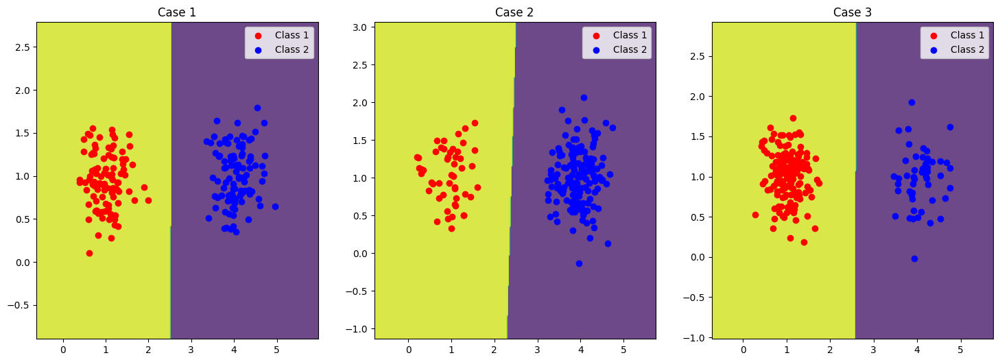

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import multivariate_normal

##########################################
# Part-4a)-0: Data Generation
##########################################

# Parameters for Case 1
m1 = np.array([1, 1])
m2 = np.array([4, 1])
cov = np.array([[0.1, 0], [0, 0.1]])

# Case 1: Generate 100 samples from each class
class1_case1 = np.random.multivariate_normal(m1, cov, 100)
class2_case1 = np.random.multivariate_normal(m2, cov, 100)

# Case 2: Generate 50 samples from class1 and 150 samples from class2
class1_case2 = np.random.multivariate_normal(m1, cov, 50)
class2_case2 = np.random.multivariate_normal(m2, cov, 150)

# Case 3: Generate 150 samples from class1 and 50 samples from class2
class1_case3 = np.random.multivariate_normal(m1, cov, 150)
class2_case3 = np.random.multivariate_normal(m2, cov, 50)

##########################################
# Part-4a)-4: Plot the decision regions for all the three cases
##########################################

def decisionBoundary(X_train, Y_train):
    # Inputs: Training data and Training labels
    # Outputs: Decision boundary parameters, i.e., w0, w

    # Prior probabilities
    p_c1 = len(Y_train[Y_train == 0]) / len(Y_train)
    p_c2 = 1. - p_c1

    # Means of each class
    mean_1 = np.mean(X_train[Y_train == 0], axis=0)
    mean_2 = np.mean(X_train[Y_train == 1], axis=0)

    # Covariance matrices
    cov1 = np.cov(X_train[Y_train == 0], rowvar=False)
    cov2 = np.cov(X_train[Y_train == 1], rowvar=False)

    # Shared covariance matrix
    cov = (cov1 + cov2) / 2

    # Calculate the parameters of the decision boundary
    cov_inv = np.linalg.inv(cov)
    w = np.dot((mean_1 - mean_2), cov_inv)
    w0 = -0.5 * np.dot(np.dot(mean_1.T, cov_inv), mean_1) + 0.5 * np.dot(np.dot(mean_2.T, cov_inv), mean_2) + np.log(p_c1 / p_c2)

    return np.array([w0] + list(w))

# Plot the decision regions
def plot_decision_regions(ax, X_train, Y_train, title):
    x_min, x_max = X_train[:, 0].min() - 1, X_train[:, 0].max() + 1
    y_min, y_max = X_train[:, 1].min() - 1, X_train[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.02), np.arange(y_min, y_max, 0.02))
    Z = np.dot(np.c_[xx.ravel(), yy.ravel()], w[1:]) + w[0]
    Z = np.where(Z >= 0, 1, 0)
    Z = Z.reshape(xx.shape)
    ax.contourf(xx, yy, Z, alpha=0.8)
    ax.scatter(X_train[Y_train == 0][:, 0], X_train[Y_train == 0][:, 1], color='red', label='Class 1')
    ax.scatter(X_train[Y_train == 1][:, 0], X_train[Y_train == 1][:, 1], color='blue', label='Class 2')
    ax.set_title(title)
    ax.legend()

# Plotting decision boundaries for all three cases
fig, axs = plt.subplots(1, 3, figsize=(18, 6))

for i, (X_train, Y_train) in enumerate([(np.vstack((class1_case1, class2_case1)), np.hstack((np.zeros(100), np.ones(100)))),
                                         (np.vstack((class1_case2, class2_case2)), np.hstack((np.zeros(50), np.ones(150)))),
                                         (np.vstack((class1_case3, class2_case3)), np.hstack((np.zeros(150), np.ones(50))))]):
    w = decisionBoundary(X_train, Y_train)
    plot_decision_regions(axs[i], X_train, Y_train, f'Case {i+1}')

plt.show()


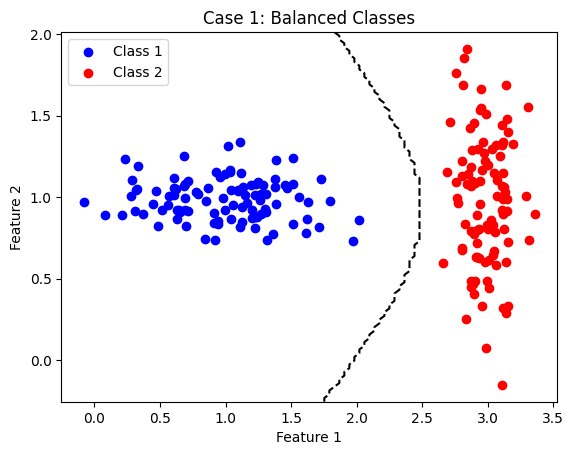

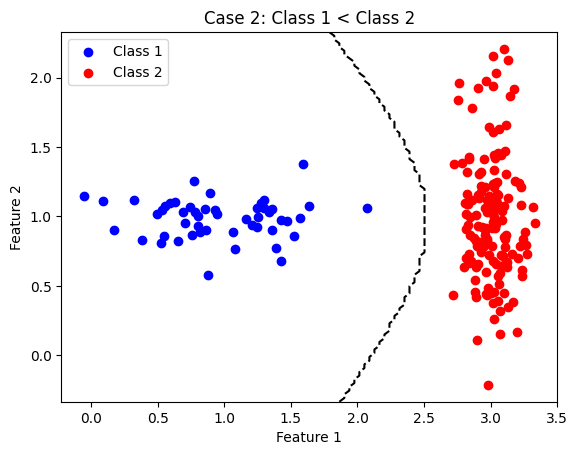

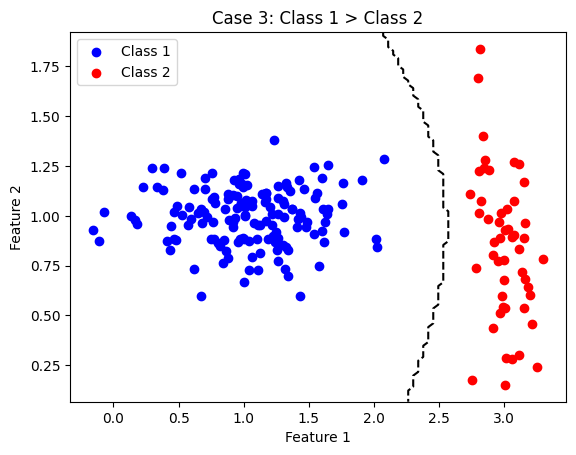

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

##########################################
# Part-4b)-0: Data Generation
##########################################

# Parameters for Case 1
m1 = np.array([1, 1])
m2 = np.array([3, 1])
cov1 = np.array([[0.2, 0], [0, 0.02]])
cov2 = np.array([[0.02, 0], [0, 0.2]])

# Case 1: Generate 100 samples from each class
class1_case1 = np.random.multivariate_normal(m1, cov1, 100)
class2_case1 = np.random.multivariate_normal(m2, cov2, 100)

# Case 2: Generate 50 samples from class1 and 150 samples from class2
class1_case2 = np.random.multivariate_normal(m1, cov1, 50)
class2_case2 = np.random.multivariate_normal(m2, cov2, 150)

# Case 3: Generate 150 samples from class1 and 50 samples from class2
class1_case3 = np.random.multivariate_normal(m1, cov1, 150)
class2_case3 = np.random.multivariate_normal(m2, cov2, 50)

##########################################
# Part-4b)-4: Plot the decision regions for all the three cases
##########################################

def multivariate_normal_pdf(x, mean, cov):
    # Calculate the determinant and inverse of the covariance matrix
    det_cov = np.linalg.det(cov)
    inv_cov = np.linalg.inv(cov)

    # Calculate the exponent
    exponent = -0.5 * np.dot(np.dot((x - mean).T, inv_cov), (x - mean))

    # Calculate the PDF
    pdf = (1.0 / (2 * np.pi * np.sqrt(det_cov))) * np.exp(exponent)
    return pdf

def decisionBoundary(X_train, Y_train, X_test):
    # Inputs: Training data, Training labels, Testing data
    # Outputs: Predicted class labels for testing data

    # Prior probabilities
    p_c1 = len(Y_train[Y_train == 0]) / len(Y_train)
    p_c2 = 1. - p_c1

    # Means of each class
    mean_1 = np.mean(X_train[Y_train == 0], axis=0)
    mean_2 = np.mean(X_train[Y_train == 1], axis=0)

    # Covariance matrices
    cov1 = np.cov(X_train[Y_train == 0], rowvar=False)
    cov2 = np.cov(X_train[Y_train == 1], rowvar=False)

    # Compute predictions on test data
    predictions = []
    for x in X_test:
        p_x_c1 = multivariate_normal_pdf(x, mean=mean_1, cov=cov1)
        p_x_c2 = multivariate_normal_pdf(x, mean=mean_2, cov=cov2)
        if p_x_c1 * p_c1 > p_x_c2 * p_c2:
            predictions.append(0)
        else:
            predictions.append(1)
    return np.array(predictions)

def plot_decision_regions(class1, class2, title):
    plt.scatter(class1[:, 0], class1[:, 1], c='b', label='Class 1')
    plt.scatter(class2[:, 0], class2[:, 1], c='r', label='Class 2')

    # Generate a meshgrid for decision boundary visualization
    x_min, x_max = plt.xlim()
    y_min, y_max = plt.ylim()
    xx, yy = np.meshgrid(np.linspace(x_min, x_max, 100), np.linspace(y_min, y_max, 100))
    Z = decisionBoundary(np.vstack((class1, class2)), np.hstack((np.zeros(len(class1)), np.ones(len(class2)))), np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)

    # Plot decision boundary
    plt.contour(xx, yy, Z, levels=[0.5], colors='black', linestyles='dashed')

    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.title(title)
    plt.legend()
    plt.show()

# Plot decision regions for all three cases
plot_decision_regions(class1_case1, class2_case1, 'Case 1: Balanced Classes')
plot_decision_regions(class1_case2, class2_case2, 'Case 2: Class 1 < Class 2')
plot_decision_regions(class1_case3, class2_case3, 'Case 3: Class 1 > Class 2')


<b> Report your observations </b>

## Observations:

### Linear Decision Boundary (Shared Covariance Matrix):

1. When the class distributions share the same covariance matrix, the decision boundary appears linear.
2. In the case where `p(c1) = p(c2)`, the decision boundary lies equidistant between the centroids of the two classes.
3. When `p(c1) < p(c2)`, the decision boundary shifts towards the class with higher prior probability. This is evident from the plot where 50 samples are generated from class 1 and 150 samples from class 2.
4. Conversely, when `p(c1) > p(c2)`, the decision boundary shifts towards the class with lower prior probability. This is evident from the plot where 150 samples are generated from class 1 and 50 samples from class 2.

### Non-linear Decision Boundary (Different Covariance Matrices):

1. With different covariance matrices for each class, the decision boundary becomes non-linear.
2. Similar to the linear case, when `p(c1) = p(c2)`, the decision boundary tends to be equidistant between the centroids of the two classes. However, due to the different covariance matrices, the boundary may exhibit curvature.
3. As the ratio of class priors shifts, the decision boundary adapts accordingly. When `p(c1) < p(c2)`, the decision boundary shifts towards the class with higher prior probability, and vice versa.

Overall, the decision boundary's behavior is influenced by the relative probabilities of the classes and the shape of their covariance matrices. In the linear case, the boundary remains linear, while in the non-linear case, it exhibits curvature due to the differing covariance matrices. The boundary's movement reflects the shifts in class probabilities, demonstrating the influence of prior knowledge on the classification decision.




<b> Part-5) Classification using logistic regression ( Iterative reweighted least squares approach ): </b> logistic regression model: $y = \frac{1}{1+e^{-\textbf{w}^{T}\textbf{x}}}$. With the provided training data, X_train and Y_train, your task is to identify the optimal $\textbf{w}$ that accurately predicts y based on the input $\textbf{x}$. Subsequently, this $\textbf{w}$ can be applied to predict outcomes on the test data, X_test.





a). Data generation: Consider a classification scenario with two classes. Class 1 follows a Gaussian distribution with a mean vector $\begin{bmatrix} 1  \\ 1  \end{bmatrix}$ and a covariance matrix $\begin{bmatrix} 0.3 & 0.0  \\ 0.0 & 0.3 \end{bmatrix}$. Class 2 follows a Gaussian distribution with a mean vector $\begin{bmatrix} 2  \\ 2  \end{bmatrix}$ and a covariance matrix $\begin{bmatrix} 0.3 & 0.0  \\ 0.0 & 0.3 \end{bmatrix}$. Employ these class distributions to generate 50 samples per class for training and 200 samples for testing.

b). Create a function called "Logistic_Regression" that accepts training data, training labels, and testing data as inputs. The function should aim to discover the optimal $\textbf{w}$ using the training data. You can initialize $\textbf{w}$ with random values and iteratively update it to determine the optimal $\textbf{w}$. Subsequently, this optimal $\textbf{w}$ can be employed to make predictions on the test data.

c). Evaluate the classification performance, i.e., compute the accuracy on the test data.

d). Write a function to generate & visualize the decision regions, either by showing the boundary line or by using different colors for the two regions. Overlay the test points using scatter.

e). Introduce genuine outliers to one of the class datasets generated previously. Then, conduct Least Squares classification and Logistic Regression on this modified dataset. Plot the decision boundaries/regions and provide insights into the differences between their outcomes.


f). Report your observations




 Accuracy with Logistic Regression: 0.885 




<ipython-input-14-706b7fbb6b39>:83: UserWarning: You passed a edgecolor/edgecolors ('black') for an unfilled marker ('x').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  plt.scatter(x=X[y == cl, 0], y=X[y == cl, 1], c=colors[idx], marker=markers[idx], label=cl, edgecolor='black')


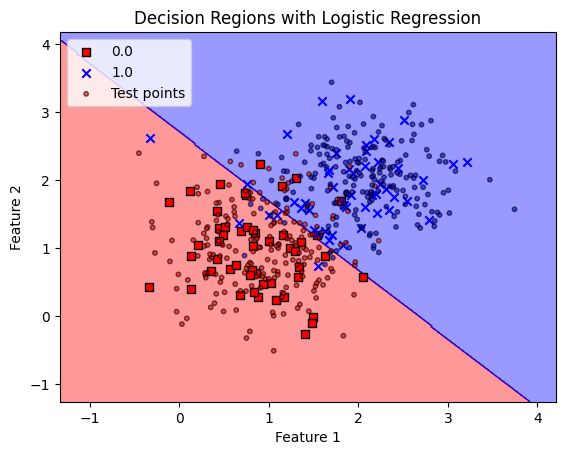

Accuracy with alternate target labels using LS: 0.9075


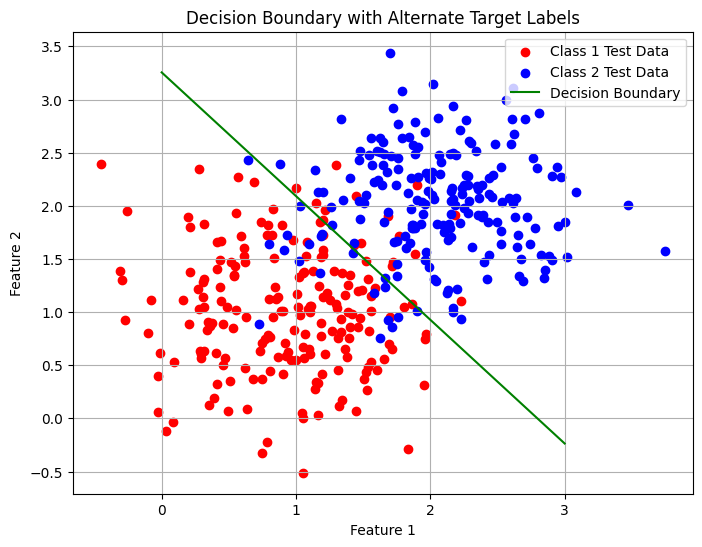

<ipython-input-14-706b7fbb6b39>:38: RuntimeWarning: overflow encountered in exp
  preds = 1 / (1 + np.exp(-X.dot(w)))  # Sigmoid function
<ipython-input-14-706b7fbb6b39>:46: RuntimeWarning: overflow encountered in exp
  test_preds = 1 / (1 + np.exp(-X_test_bias.dot(w))) > threshold


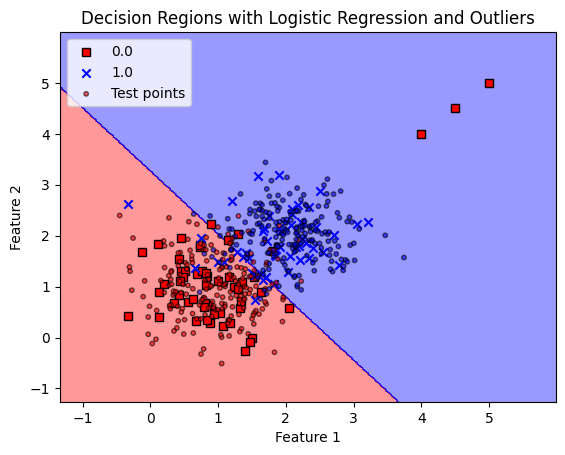

In [ ]:
# All imports
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

##################################################
# Part-5)-1: Data generation
##################################################

# Set the parameters of class distribution
mean1 = [1, 1]           # Mean of class1
mean2 = [2, 2]           # Mean of class2
cov = [[0.3, 0.0], [0.0, 0.3]]  # Covariance matrix. Same covariance for class1 and class2

# Generate training data
class1_tr = np.random.multivariate_normal(mean1, cov, 50)  # Class1 training data
class2_tr = np.random.multivariate_normal(mean2, cov, 50)  # Class2 training data
tr_data = np.vstack((class1_tr, class2_tr))                # Combine class1 training and class2 training data
tr_targets = np.hstack((np.zeros(50), np.ones(50)))        # Class labels

# Generate testing data
class1_te = np.random.multivariate_normal(mean1, cov, 200) # Class1 testing data
class2_te = np.random.multivariate_normal(mean2, cov, 200) # Class2 testing data
te_data = np.vstack((class1_te, class2_te))                # Combine testing data
te_targets = np.hstack((np.zeros(200), np.ones(200)))      # Class labels


##################################################
# Part-5)-b: Logistic regression function
##################################################
def Logistic_Regression(X_train, Y_train, X_test):
    max_iter = 100  # max number of iterations for parameter update
    threshold = 0.5
    X = np.hstack((np.ones((X_train.shape[0], 1)), X_train))  # Append ones for bias
    w = np.random.rand(X.shape[1])  # Initialize weights

    for iter in range(max_iter):
        preds = 1 / (1 + np.exp(-X.dot(w)))  # Sigmoid function
        error = preds - Y_train
        gradient = X.T.dot(error)  # Gradient
        H = (preds * (1 - preds) * X.T).dot(X)  # Hessian
        w -= np.linalg.pinv(H).dot(gradient)  # Update weights using Newton-Raphson method

    # Predictions on test data
    X_test_bias = np.hstack((np.ones((X_test.shape[0], 1)), X_test))
    test_preds = 1 / (1 + np.exp(-X_test_bias.dot(w))) > threshold
    return test_preds.astype(int)

Y_pred = Logistic_Regression(tr_data, tr_targets, te_data)

###############################################
# Part-5)-c: Accuracy function
###############################################
def LR_Accuracy(Y_test, Y_pred):
    acc = np.mean(Y_test == Y_pred)
    return acc

acc = LR_Accuracy(te_targets, Y_pred)
print('\n\n Accuracy with Logistic Regression:', acc, '\n\n')


##########################################
# Part-5)-d: Plot decision regions and overlay test points
##########################################
def plot_decision_regions(X, y, X_test, y_test, title):
    markers = ('s', 'x')
    colors = ('red', 'blue')
    cmap = ListedColormap(colors[:len(np.unique(y))])

    # plot the decision surface
    x1_min, x1_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    x2_min, x2_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx1, xx2 = np.meshgrid(np.arange(x1_min, x1_max, 0.02),
                           np.arange(x2_min, x2_max, 0.02))
    Z = Logistic_Regression(X, y, np.array([xx1.ravel(), xx2.ravel()]).T)
    Z = Z.reshape(xx1.shape)
    plt.contourf(xx1, xx2, Z, alpha=0.4, cmap=cmap)
    plt.xlim(xx1.min(), xx1.max())
    plt.ylim(xx2.min(), xx2.max())

    # plot class samples
    for idx, cl in enumerate(np.unique(y)):
        plt.scatter(x=X[y == cl, 0], y=X[y == cl, 1], c=colors[idx], marker=markers[idx], label=cl, edgecolor='black')
    plt.scatter(X_test[:, 0], X_test[:, 1], c=y_test, marker='o', s=10, edgecolor='k', cmap=cmap, alpha=0.6, label='Test points')
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.legend(loc='upper left')
    plt.title(title)
    plt.show()

# Plotting decision regions
plot_decision_regions(tr_data, tr_targets, te_data, te_targets, 'Decision Regions with Logistic Regression')

predictions_alternate = LS_Classify(tr_data, tr_targets, te_data)
predictions_alternate = threshold_prediction(predictions_alternate)

# Calculate accuracy with alternate target labels
accuracy_alternate = LS_Classify_Accuracy(te_targets, predictions_alternate)
print("Accuracy with alternate target labels using LS:", accuracy_alternate)

# Visualize the decision boundary with alternate target labels
plot_decision_boundary(te_data, te_targets, "Decision Boundary with Alternate Target Labels", 0.5)

##########################################
# Part-5)-d: True Outliers
##########################################

class1_tr_outliers = np.vstack((class1_tr, np.array([[4, 4], [4.5, 4.5], [5, 5]])))
tr_data_outliers = np.vstack((class1_tr_outliers, class2_tr))
tr_targets_outliers = np.hstack((np.zeros(len(class1_tr_outliers)), np.ones(len(class2_tr))))

# Apply Logistic Regression on the modified dataset
Y_pred_outliers = Logistic_Regression(tr_data_outliers, tr_targets_outliers, te_data)

# Plot decision regions for the modified dataset
plot_decision_regions(tr_data_outliers, tr_targets_outliers, te_data, te_targets, 'Decision Regions with Logistic Regression and Outliers')


Report your Observations

1.Sensitivity to Outliers:
Least Squares is sensitive to outliers, impacting its decision boundary and accuracy. Outliers, data points deviating significantly from the dataset, can heavily influence Least Squares, leading to skewed decision boundaries and reduced accuracy. They distort regression coefficient estimation, affecting outcome prediction.

2.Robustness of Logistic Regression:
Logistic Regression is robust to outliers, maintaining decision regions unaffected. Its probabilistic nature estimates class probabilities iteratively, reducing outlier impact. Parameters update based on log-likelihood, enabling effective outlier handling. Logistic Regression ensures outliers do not compromise decision boundaries or classification accuracy.

3.Outliers affect Least Squares and Logistic Regression differently, emphasizing the need to choose suitable classification algorithms based on dataset characteristics. Least Squares struggles with accuracy due to outlier susceptibility, while Logistic Regression provides stable decision regions despite outliers. Understanding these differences informs algorithm selection, particularly for datasets with outliers or noise.


<b> Part (6) : Estimating the parameters of Gaussian Mixture Models (GMM) using Expectation-Maximization (EM) algorithm </b>


<dt> <b> a. Generating synthetic data : </b>  This part describes the steps involved in generating the synthetic data. </dt>


<dt>  1. Let us consider the GMM with Bivariate Gaussians   </dt>
<dd>  - Choose the appropriate means ($\mu$), covariances ($\Sigma$), and weights ($\pi$) of Bivariate Gaussian distributions. You may choose the following parameters for this asignment.  </dd>
<br>
<dt>  <center> $ \pi = \begin{bmatrix} 0.6  \\ 0.4 \end{bmatrix} \;\;\;\; \mu_{1} = \begin{bmatrix} -1.0  \\ -1.0 \end{bmatrix} \;\;\;\; \mu_{2} = \begin{bmatrix} 1.0  \\ 1.0 \end{bmatrix} \;\;\;\; $ </center>   </dd>
<br>
<dt>  <center> $ \Sigma_{1}^{full} = \begin{bmatrix} 0.15 & 0.1  \\ 0.1 & 0.25 \end{bmatrix} \;\;\;\; \Sigma_{2}^{full} = \begin{bmatrix} 0.3 & -0.25  \\ -0.25 & 0.25 \end{bmatrix}  $ </center>  </dd>
<br>
<dt>  <center> $ \Sigma_{1}^{diagonal} = \begin{bmatrix} 0.1 & 0.0  \\ 0.0 & 0.2 \end{bmatrix} \;\;\;\; \Sigma_{2}^{diagonal} = \begin{bmatrix} 0.2 & 0.0  \\ 0.0 & 0.1 \end{bmatrix}  $ </center>  </dd>
<br>
<dt>  <center> $ \Sigma_{1}^{spherical} = \begin{bmatrix} 0.2 & 0.0  \\ 0.0 & 0.2 \end{bmatrix} \;\;\;\; \Sigma_{2}^{spherical} = \begin{bmatrix} 0.1 & 0.0  \\ 0.0 & 0.1 \end{bmatrix}  $ </center>  </dd>

<dd>  - Pick one Gaussian following the selection probability as  $\pi$    </dd>
<dd>  - Sample the data point from the selected Bivariate Gaussian distribution    </dd>
<dd>  - Repeat the process N times to get the entire data set  </dd>
<dt>  2.Create the synthetic data set with the number of mixtures as 2.  </dt>
<dt>  3.Plot the synthetic data set with unique colors to the data points drawn from each Bivariate Gaussian distribution in GMM  </h4> </dt> </dd>

<dt> <b> b. Implementation of Expectation and Maximization (EM) algorithm : </b> This part focuses on implementing the EM algorithm from scratch to estimate the parameters of the Gaussian Mixture Model (GMM). </dt>  

<dt>  1. Chose the number of mixtures (M) and initialize the parameters of GMM model  </dt>
<dd>  - Make sure that the diagonal elements of covariance are positive, and the weights of Gaussians are positive and sum to 1 for satisfying the axioms of probability.  </dd>

<dt>   2. Expectation step :  Evaluate the responsibility of Gaussians in generating the data points using the current estimated parameters i.e $\hat\mu_{k}$ , $\hat\Sigma_{k}$ and $\hat\pi_{k}$, here k indicates the Gaussian in GMM  </dt>
<br>

<dd>  <center> $\gamma_{nk} = \frac{\pi_{k} N ( \textbf{x}_{n} / \mu_{k} , \Sigma_{k} )}{ \sum_{m=1}^{M} \pi_{m} N ( x_{n} / \mu_{m} , \Sigma_{m} ) }    \;\;\;\;\;\; ∀ \;\;k=1,2,...,M \;\; and \;\; n=1,2,...,N$  </center>  </dd>

<br>

<dd>   Where N is the total number of data points and M is the total number of Gaussians in GMM   </dd>

<dd>   - $\gamma_{nk}$ represents the responsibility of $k^{th}$ Gaussian in generating the $n^{th}$ data point   </dd>

<dd>   - $\sum_{n=1}^{N}$ $\gamma_{nk}$ represents the the effective number of data points generated by $k^{th}$ Gaussian   </dd>


<dt>   3. Maximization step :  Update the parameters ($\hat\mu_{k}$ , $\hat\Sigma_{k}$ and $\hat\pi_{k}$) of GMM using the current resosibilities ($\gamma_{nk}$) by maximizing the likelihood. </dt>

<dd>
 - Effective number of data points generated by $k^{th}$ Gaussian : $N_{k}$ = $\sum_{n=1}^{N}$ $\gamma_{nk}$   
 </dd>

<dd>
 - Mean of $k^{th}$ Gaussian : $\hat{\mu_{k}} = \frac{1}{N_{k}} \sum_{n=1}^{N}\gamma_{nk} x_{n}$   
 </dd>

<dd>
 - Covariance of $k^{th}$ Gaussian : $\hat{\Sigma_{k}} = \frac{1}{N_{k}} \sum_{n=1}^{N} \gamma_{nk} ( x_{n} - \hat{\mu_{k}} )( x_{n} - \hat{\mu_{k}} )^{T}$   
 </dd>

<dd>
 - Weight of $k^{th}$ Gaussian : $\hat{\pi_{k}} = \frac{N_{k}}{N}$  
 </dd>

<dt>  4. Compute the log-likelihood with the updated parameters  </dt>
<dt>   5. Repeat the expectation and maximization steps untill convergence  </dt>

<dt>  <b> c. Illustration of EM iterations </b>  </dt>

<dt>   5. Plot the contours of the estimated distributions over the iterations in the EM algorithm and overlay the data points.  </dt>

<dt>  <b> d. Understanding the issues with EM algorithm </b>  </dt>
<dt>   6. Check the influence of initialization on the convergence of the EM algorithm and fit quality.  </dt>
<dd>   - Demonstrate the observations with the plots mentioned in the "Illustration of EM iterations" section    </dd>
<dt>   6. Check the influence of the type of covariance matrix on the convergence of the EM algorithm and fit quality . </dt>
<dd>   - Execute the EM algorithm with different covariance matrices i.e Spherical, Diagonal and Full covariance  </dd>
<dd>   - Demonstrate the observations with the plots mentioned in the "Illustration of EM iterations" section  </dd>


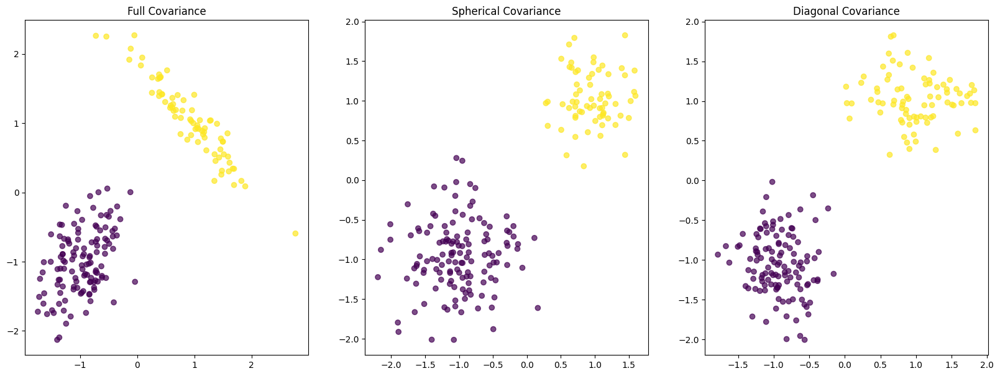

In [ ]:
import numpy as np
import pandas as pd
import random as rand
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from scipy.stats import norm, multivariate_normal
import sys
import math

##########################################
# Part-6)-a: Generating synthetic data
##########################################

def generateData(pi, mu, sigma, N):
    """
    Generates synthetic data based on Gaussian Mixture Model parameters.

    Args:
    - pi (list): Weights of Gaussians
    - mu (list): Means of Gaussians
    - sigma (list): Covariances of Gaussians
    - N (int): Number of data points

    Returns:
    - data (numpy array): Generated data points
    - labels (numpy array): Labels corresponding to each data point
    """
    data = []
    labels = []

    for _ in range(N):
        # Select Gaussian based on weights pi
        gaussian_index = np.random.choice(len(pi), p=pi)

        # Sample data point from selected Gaussian
        sample = np.random.multivariate_normal(mu[gaussian_index], sigma[gaussian_index])
        data.append(sample)
        labels.append(gaussian_index)

    return np.asarray(data), np.asarray(labels)

# Parameters
pi = [0.6, 0.4]  # Weights of Gaussians
mu1 = [-1.0, -1.0]  # Mean of Gaussian 1
mu2 = [1.0, 1.0]  # Mean of Gaussian 2
sig_full1 = [[0.15, 0.1], [0.1, 0.25]]  # Full covariance of Gaussian 1
sig_full2 = [[0.3, -0.25], [-0.25, 0.25]]  # Full covariance of Gaussian 2
sig_diag1 = [[0.1, 0], [0, 0.2]]  # Diagonal covariance of Gaussian 1
sig_diag2 = [[0.2, 0], [0, 0.1]]  # Diagonal covariance of Gaussian 2
sig_spherical1 = [[0.2, 0], [0, 0.2]]  # Spherical covariance of Gaussian 1
sig_spherical2 = [[0.1, 0], [0, 0.1]]  # Spherical covariance of Gaussian 2
n_points = 200  # Number of data points

# Create synthetic data sets
data_full, labels_full = generateData(pi, [mu1, mu2], [sig_full1, sig_full2], n_points)
data_spherical, labels_spherical = generateData(pi, [mu1, mu2], [sig_spherical1, sig_spherical2], n_points)
data_diagonal, labels_diagonal = generateData(pi, [mu1, mu2], [sig_diag1, sig_diag2], n_points)

# Plot synthetic data sets
fig, ax = plt.subplots(1, 3, figsize=(20, 7))

# Plot data sampled from GMM with full covariance matrix
ax[0].scatter(data_full[:, 0], data_full[:, 1], c=labels_full, cmap='viridis', alpha=0.7)
ax[0].set_title('Full Covariance')

# Plot data sampled from GMM with spherical covariance matrix
ax[1].scatter(data_spherical[:, 0], data_spherical[:, 1], c=labels_spherical, cmap='viridis', alpha=0.7)
ax[1].set_title('Spherical Covariance')

# Plot data sampled from GMM with diagonal covariance matrix
ax[2].scatter(data_diagonal[:, 0], data_diagonal[:, 1], c=labels_diagonal, cmap='viridis', alpha=0.7)
ax[2].set_title('Diagonal Covariance')

plt.show()


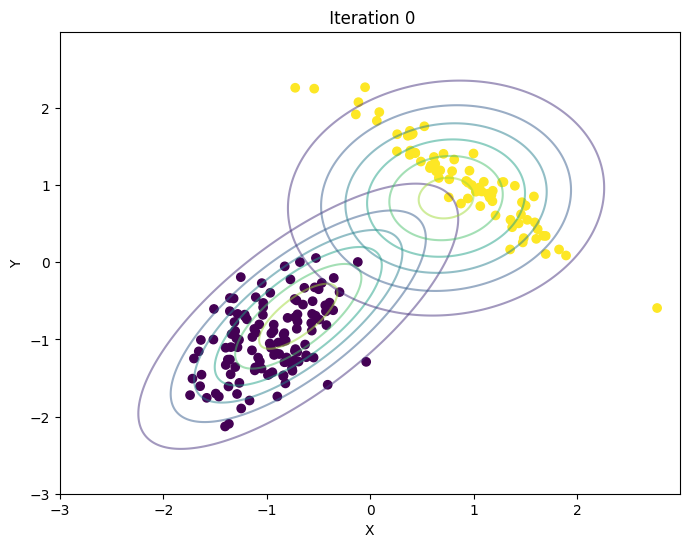

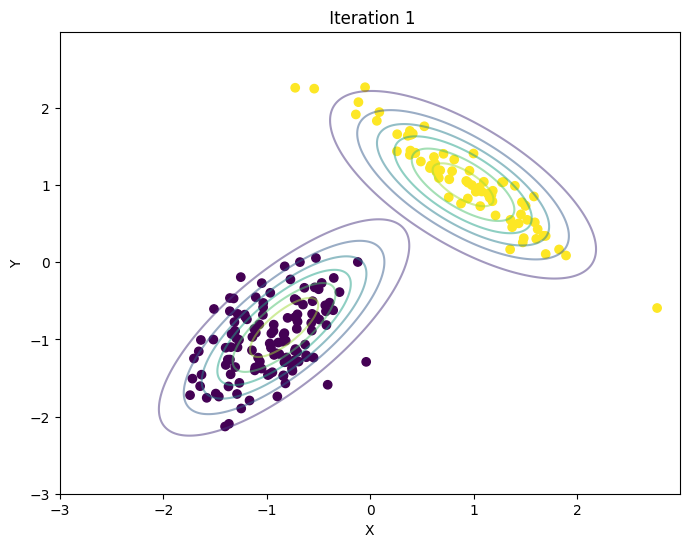

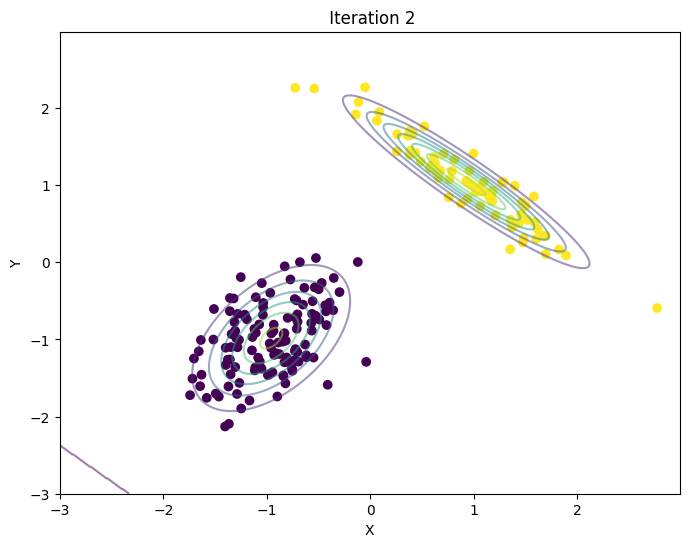

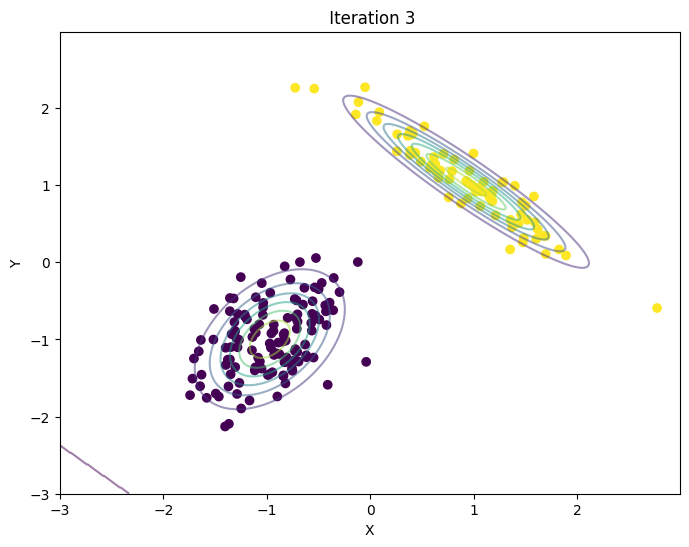

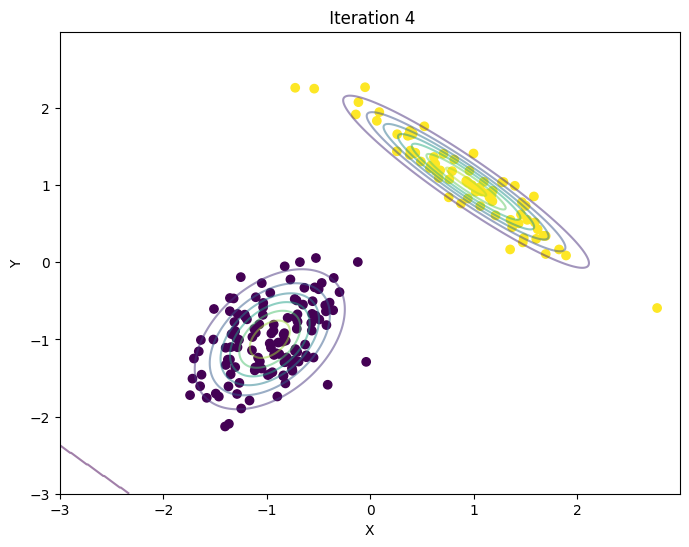

...

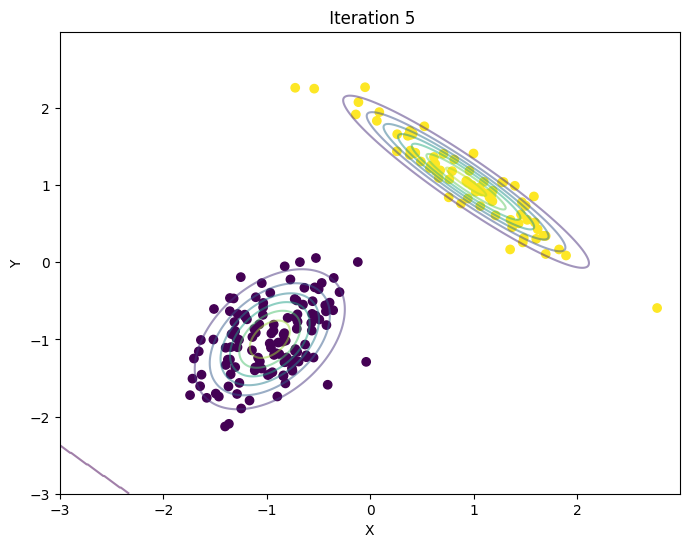

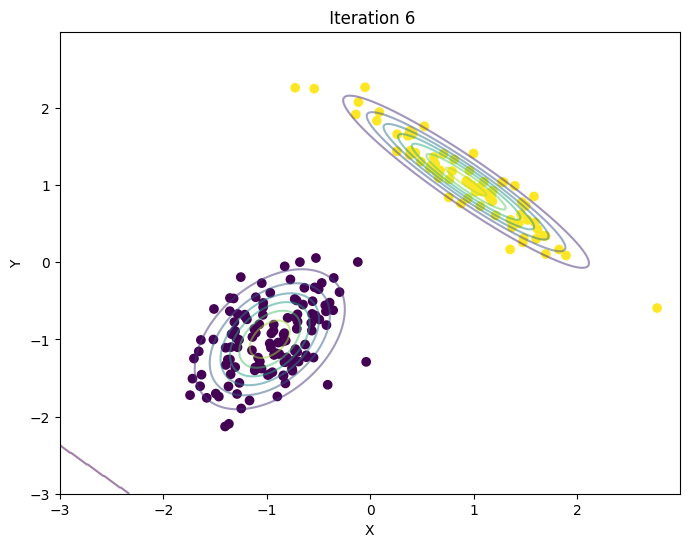

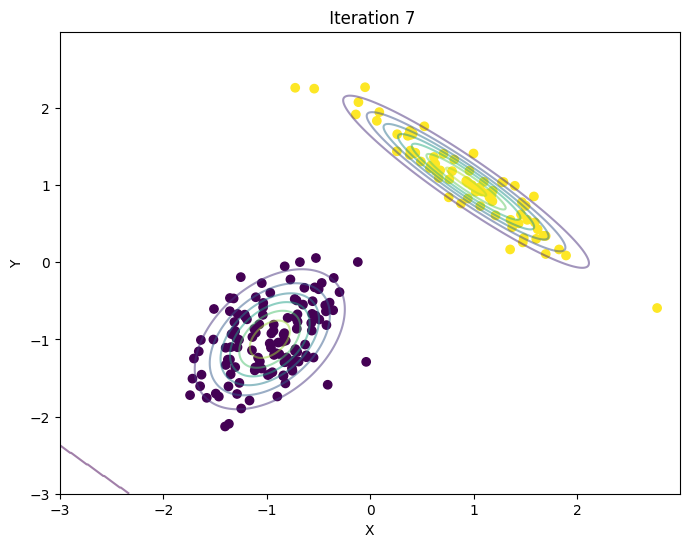

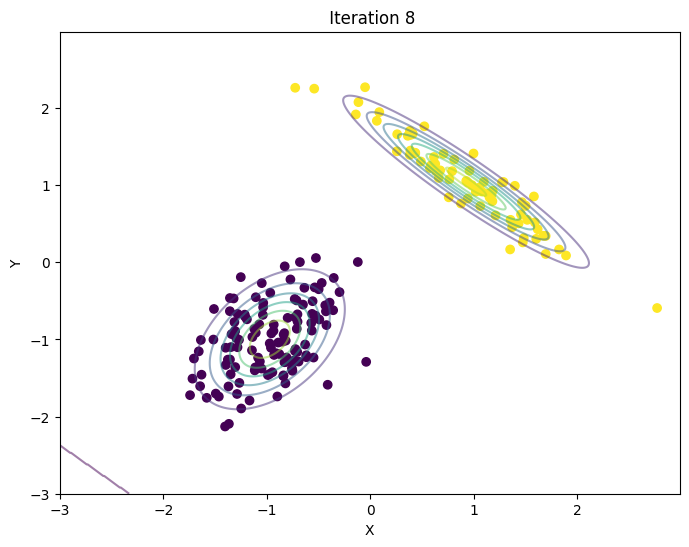

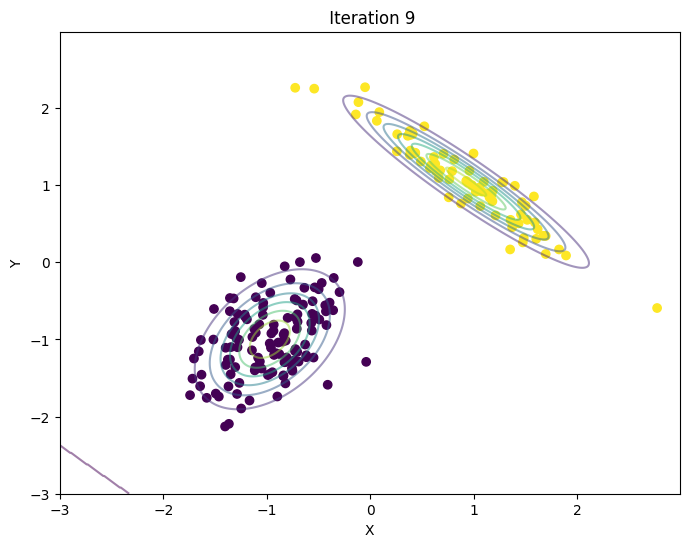

In [ ]:
# All imports
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import multivariate_normal

##########################################
# Part-6)-b: Implementation of Expectation-Maximization (EM) algorithm
##########################################

############################################################################
# Write a function to compute the log-likelihood of the data given the parameters
############################################################################
def likelihood(data, pi, mu, sigma, log_likelihood=False, likelihoods=False):
    # Inputs: data, parameters of GMM model
    # Outputs: likelihood
    likelihood_value = 0
    for n in range(len(data)):
        p_n = 0
        for k in range(len(pi)):
            p_n += pi[k] * multivariate_normal.pdf(data[n], mu[k], sigma[k])
        likelihood_value += np.log(p_n)
    if log_likelihood:
        return likelihood_value
    else:
        total_likelihood = np.exp(likelihood_value)
        if likelihoods:
            return likelihood_value, total_likelihood
        else:
            return total_likelihood

############################################################################
# Write a function for the expectation step
############################################################################
def expectation(data, pi, mu, sigma):
    # Inputs: data, parameters of GMM model
    # Outputs: gamma
    N = len(data)
    M = len(pi)
    gamma = np.zeros((N, M))
    for n in range(N):
        for k in range(M):
            gamma[n, k] = pi[k] * multivariate_normal.pdf(data[n], mu[k], sigma[k])
        gamma[n] /= np.sum(gamma[n])  # Normalize responsibilities
    return gamma

############################################################################
# Write a function for the maximization step
############################################################################
def maximization(data, gamma):
    # Inputs: data, gamma
    # Outputs: Updated parameters of GMM model
    N = len(data)
    M = gamma.shape[1]
    N_k = np.sum(gamma, axis=0)
    pi = N_k / N
    mu = np.dot(gamma.T, data) / N_k[:, None]
    sigma = np.zeros((M, data.shape[1], data.shape[1]))
    for k in range(M):
        diff = data - mu[k]
        sigma[k] = np.dot(gamma[:, k] * diff.T, diff) / N_k[k]
    return pi, mu, sigma

############################################################################
# Plot the contours
############################################################################
def plot_contours(data, labels, pi, mu, sigma, title):
    plt.figure(figsize=(8, 6))
    x, y = np.mgrid[-3:3:.01, -3:3:.01]
    pos = np.dstack((x, y))
    for k in range(len(pi)):
        rv = multivariate_normal(mu[k], sigma[k])
        plt.contour(x, y, rv.pdf(pos), alpha=0.5)
    plt.scatter(data[:, 0], data[:, 1], c=labels, cmap='viridis')
    plt.title(title)
    plt.xlabel('X')
    plt.ylabel('Y')
    plt.show()

############################################################################
# Run the expectation and maximization algorithm to estimate the parameters
############################################################################
# Data to run EM-algorithm
data = data_full
labels = labels_full
N = len(data)
D = data.shape[1]
M = 2

# Initialize the prior probabilities
pi = np.array([0.5, 0.5])
mu = np.array([[0.0, 0.0], [1.0, 1.0]])

sigma_full = [np.identity(D) for _ in range(M)]
sigma_spherical = [np.eye(D) * np.trace(sigma_full[0]), np.eye(D) * np.trace(sigma_full[1])]
sigma_diagonal = [np.diag(np.diag(sigma_full[0])), np.diag(np.diag(sigma_full[1]))]

# Number of steps to run EM algorithm
nsteps = 10

types = [sigma_full,sigma_spherical,sigma_diagonal]
for typek in types:
    pi = np.array([0.5, 0.5])
    mu = np.array([[0.0, 0.0], [1.0, 1.0]])
    for index in range(0, nsteps, 1):

        # Compute the likelihood
        ll = likelihood(data, pi, mu, typek, log_likelihood=True)

        # Expectation step
        gamma = expectation(data, pi, mu, typek)

        # Maximization step
        pi, mu, typek = maximization(data, gamma)

        # Plot the contours for full covariance
        plot_contours(data, labels, pi, mu, typek, f' Iteration {index}')

Run 1
Params:[0.5 0.5],[[0.21717963 0.07821118]
 [1.40454551 0.14644077]],[[[1. 0.]
  [0. 1.]]

 [[1. 0.]
  [0. 1.]]]


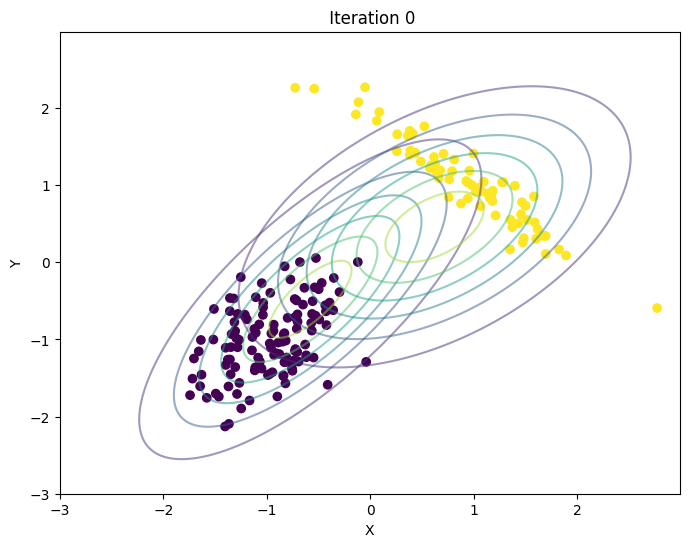

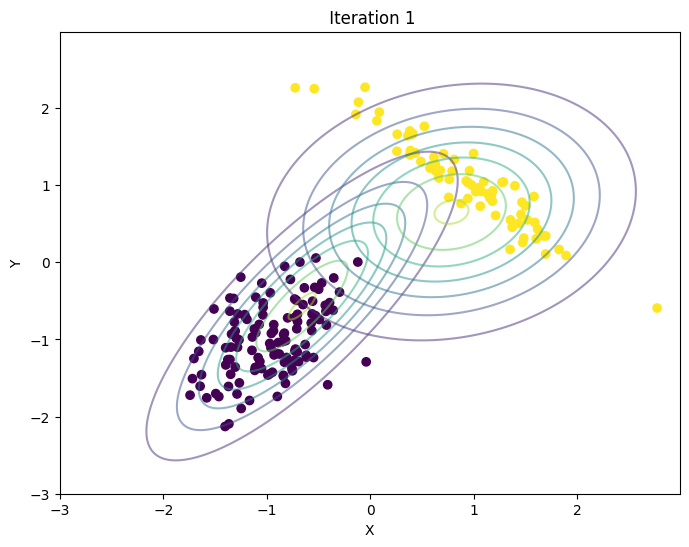

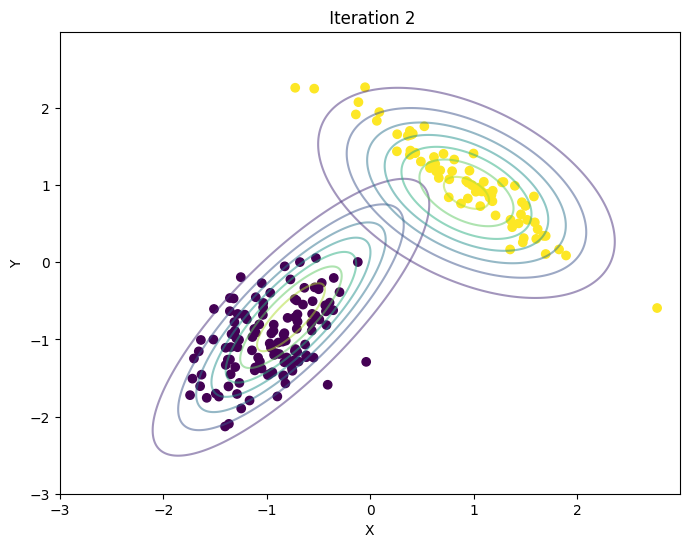

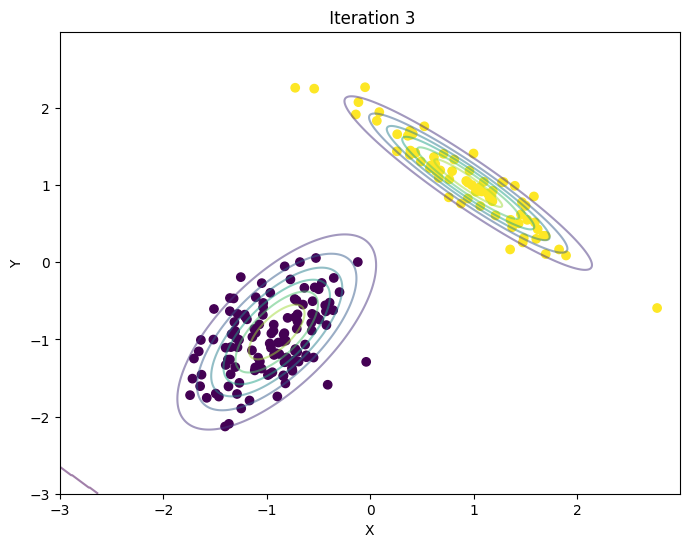

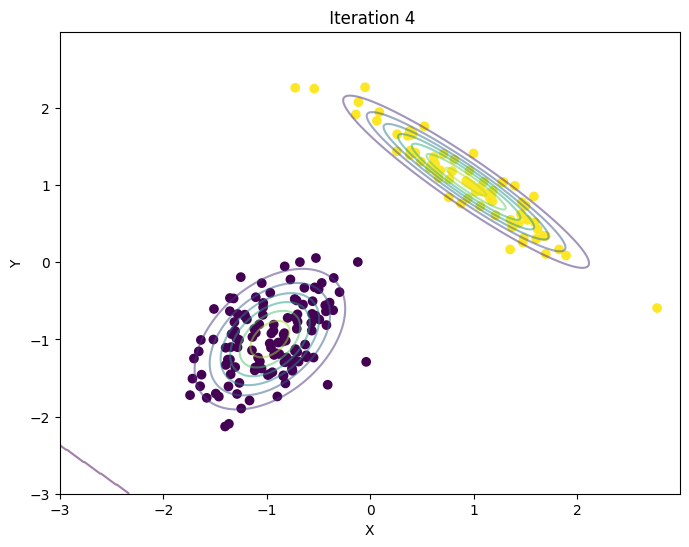

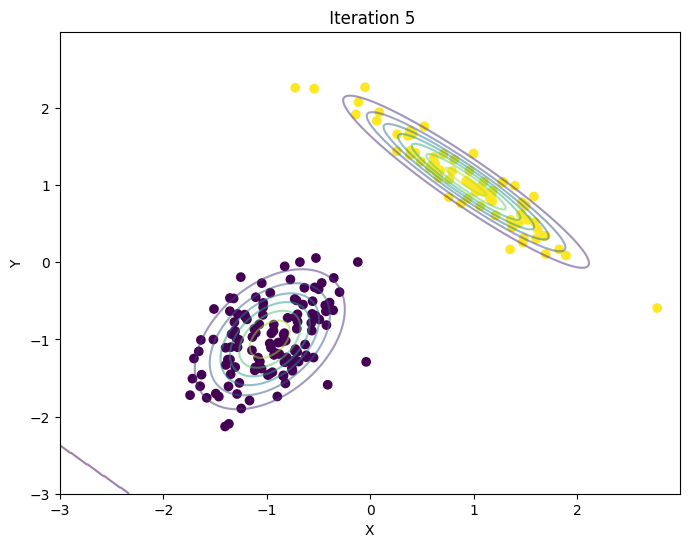

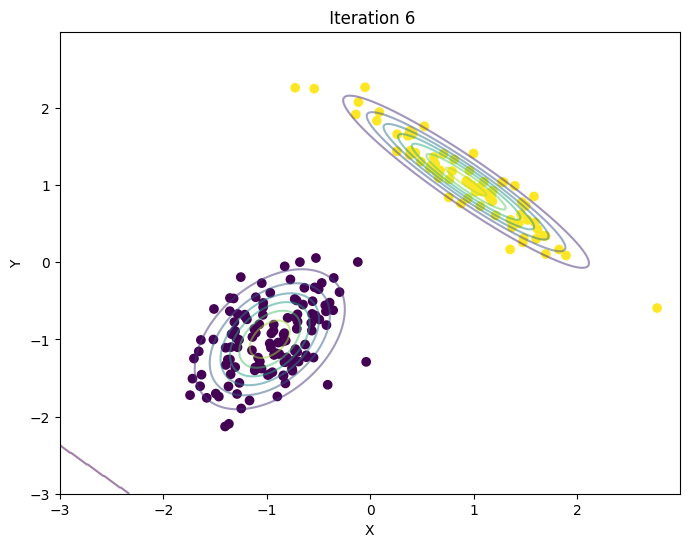

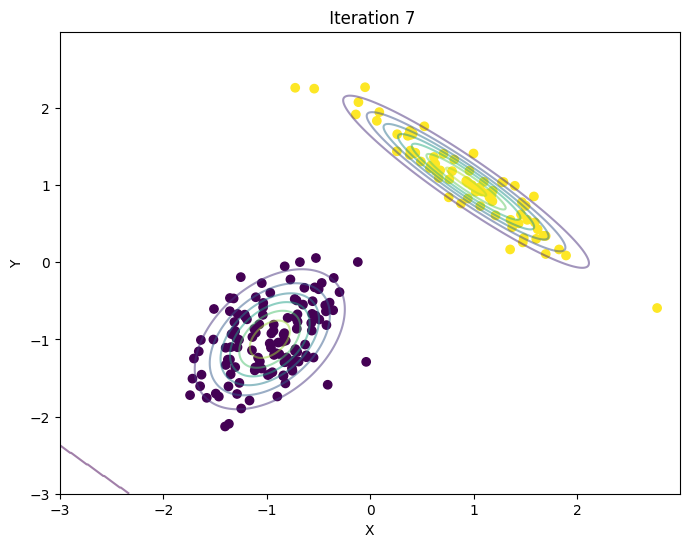

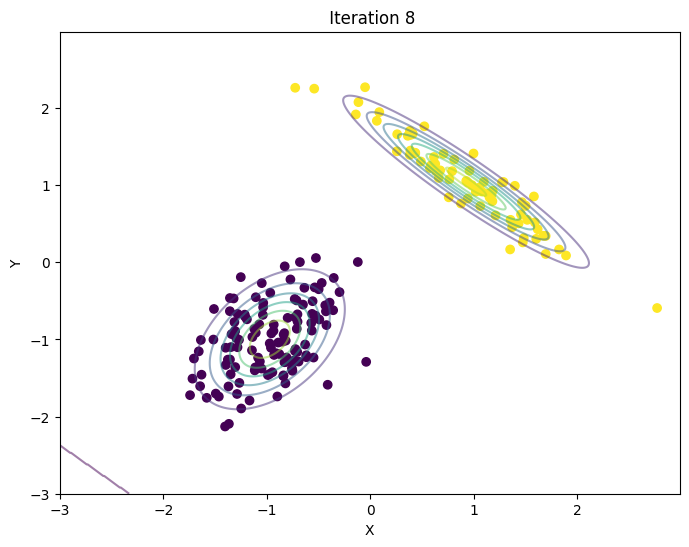

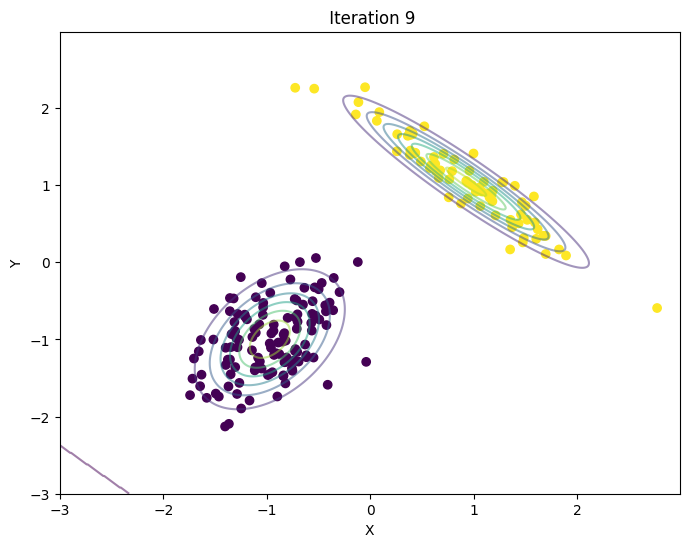

Run 2
Params:[0.5 0.5],[[-1.48124596 -1.27255814]
 [ 1.51875934 -1.17116046]],[[[1. 0.]
  [0. 1.]]

 [[1. 0.]
  [0. 1.]]]


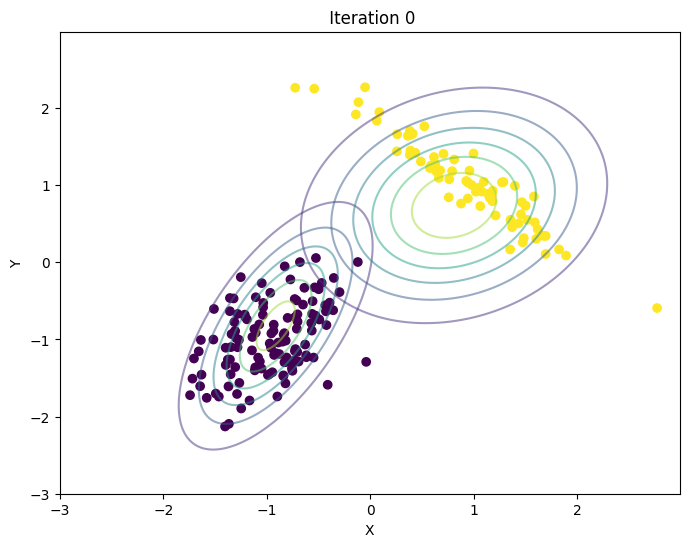

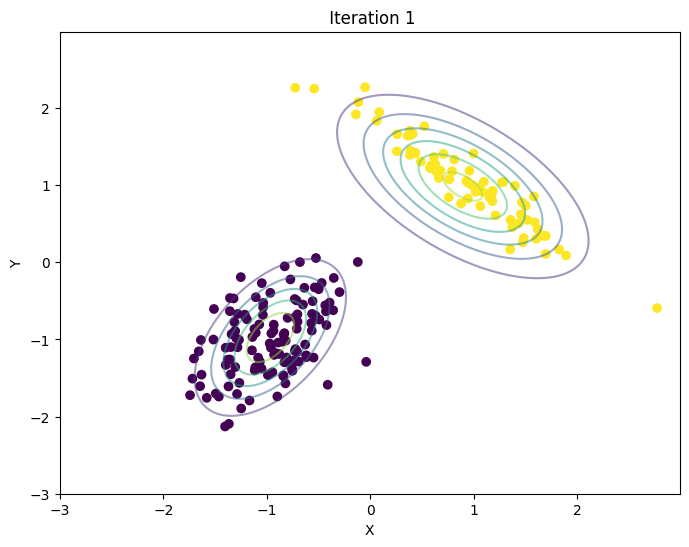

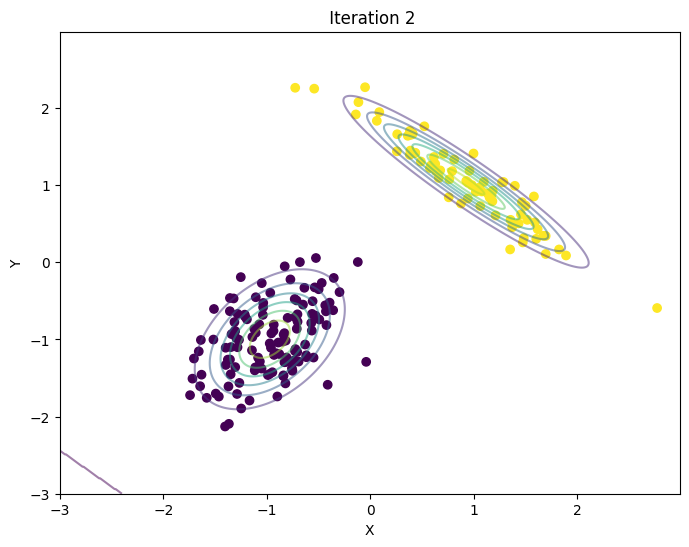

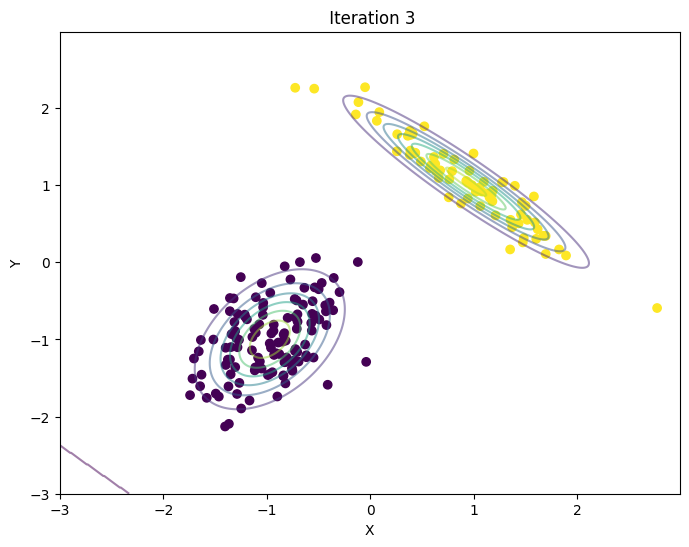

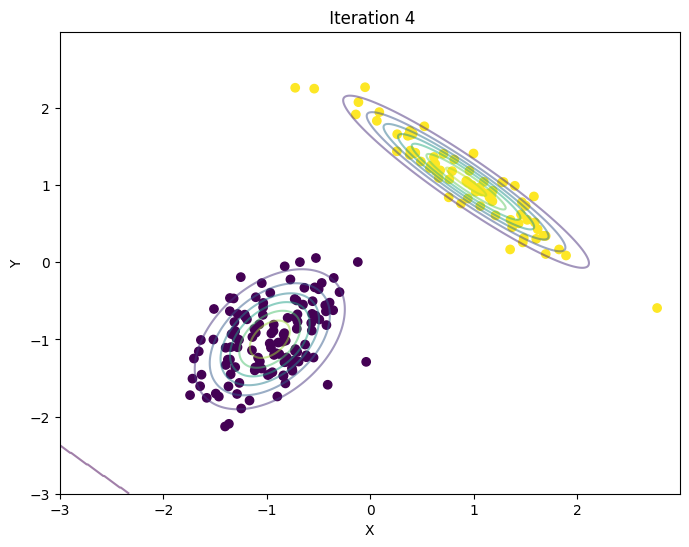

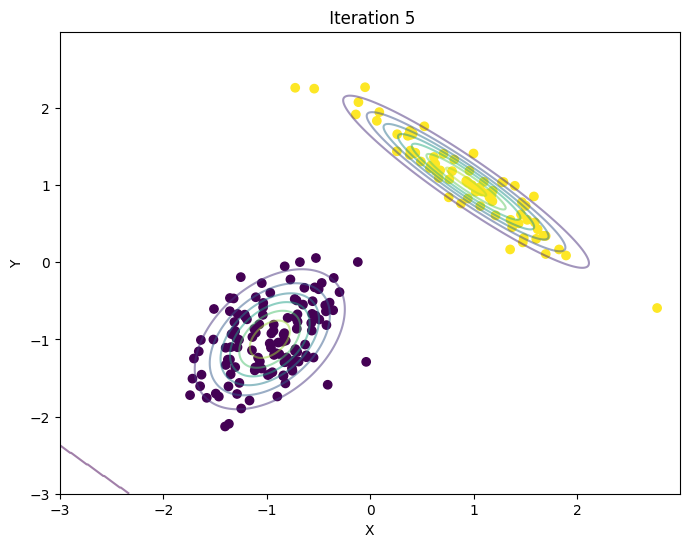

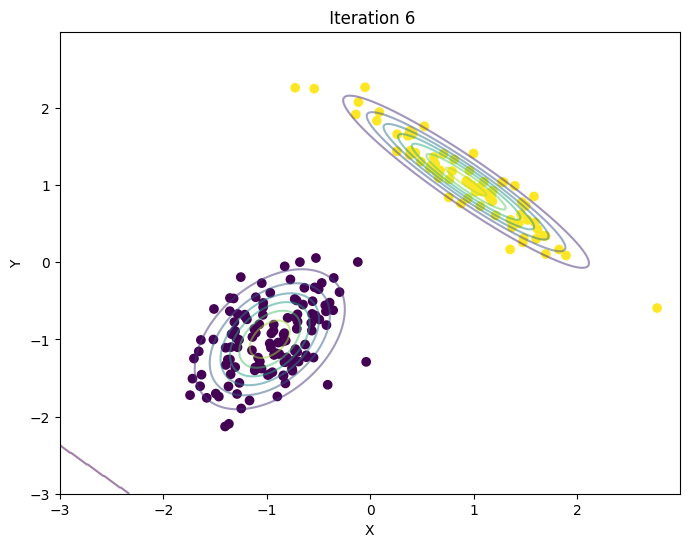

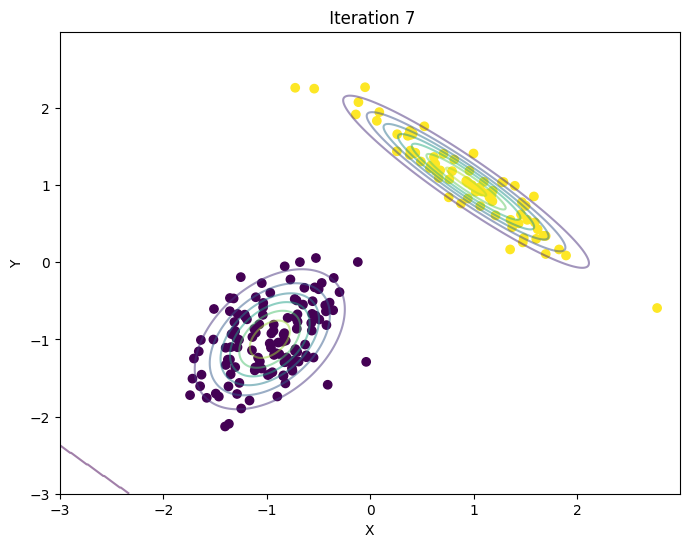

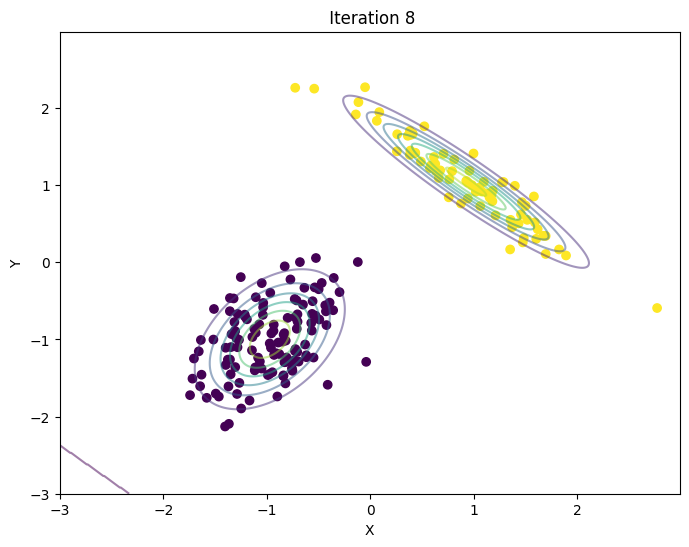

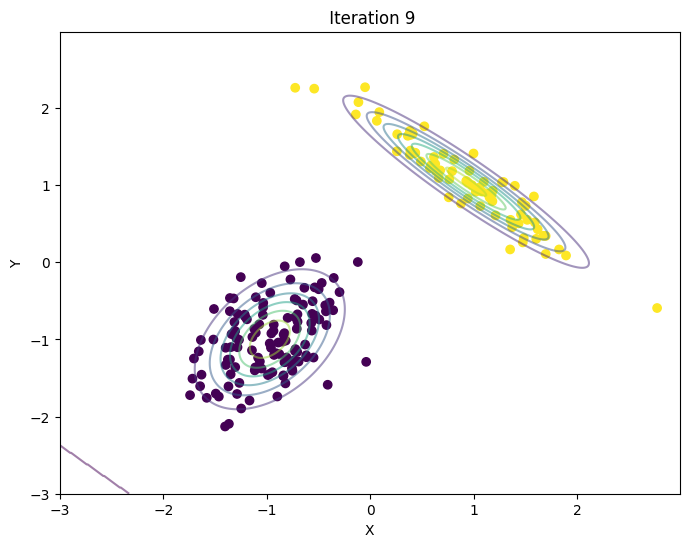

Run 3
Params:[0.5 0.5],[[ 0.76449745 -0.26837274]
 [-0.16975829 -0.13413278]],[[[1. 0.]
  [0. 1.]]

 [[1. 0.]
  [0. 1.]]]


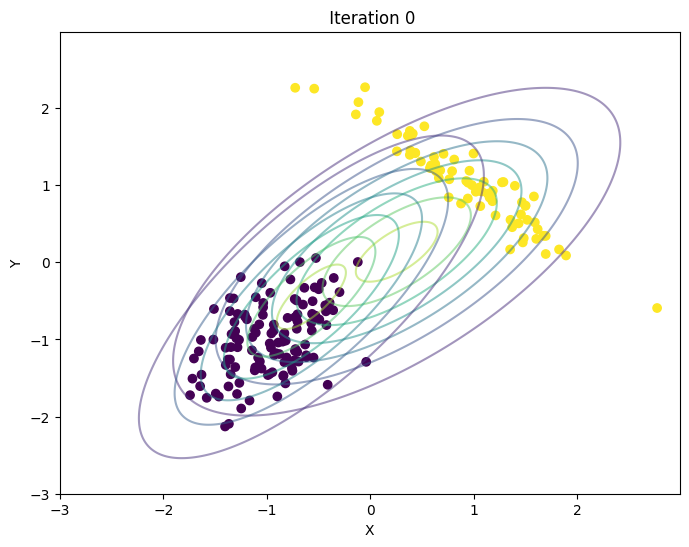

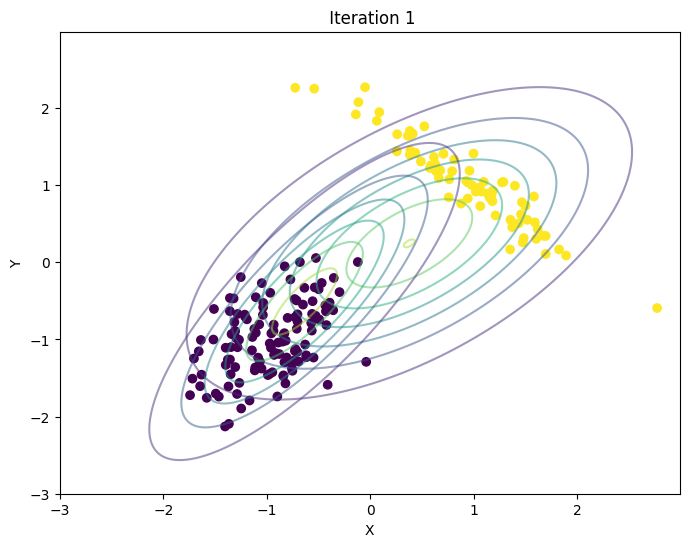

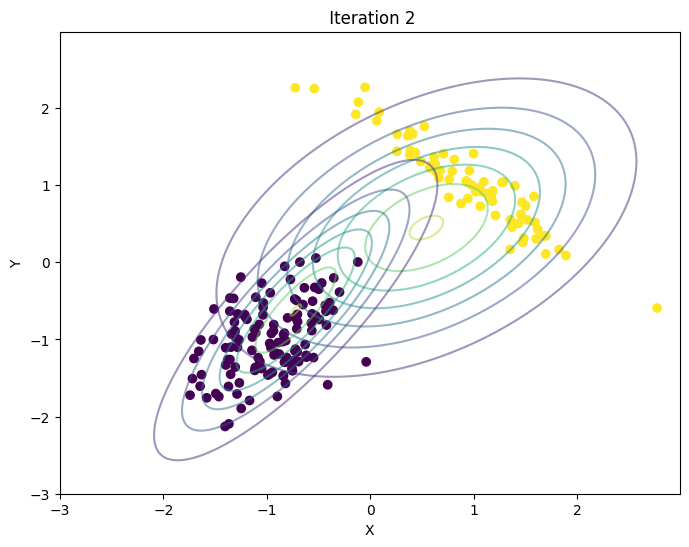

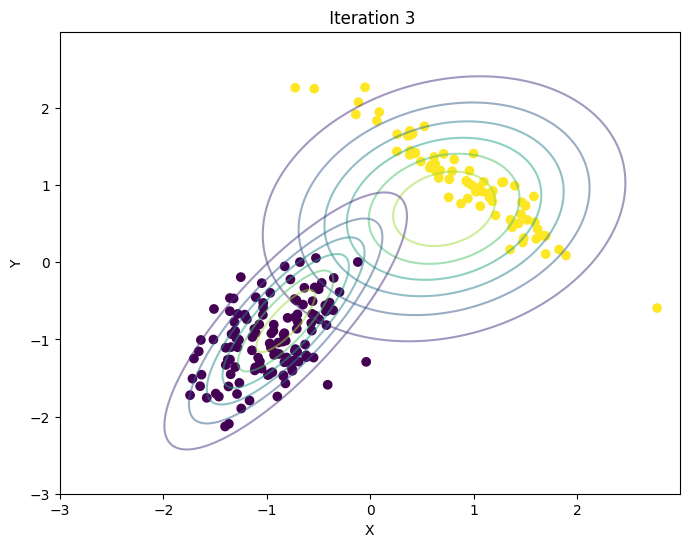

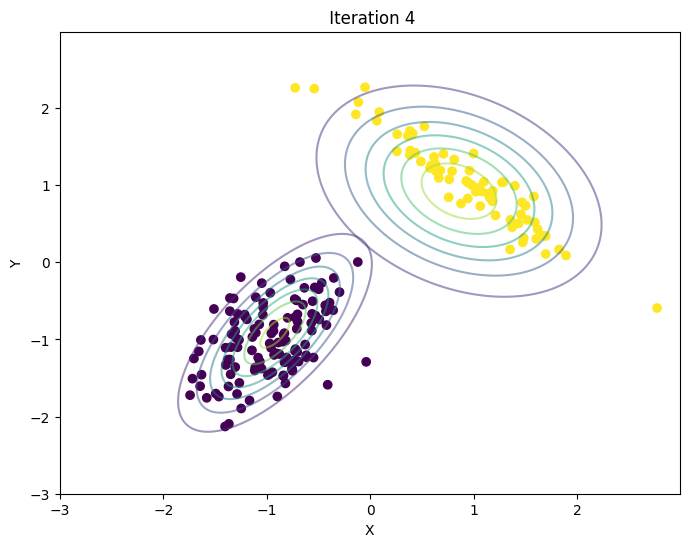

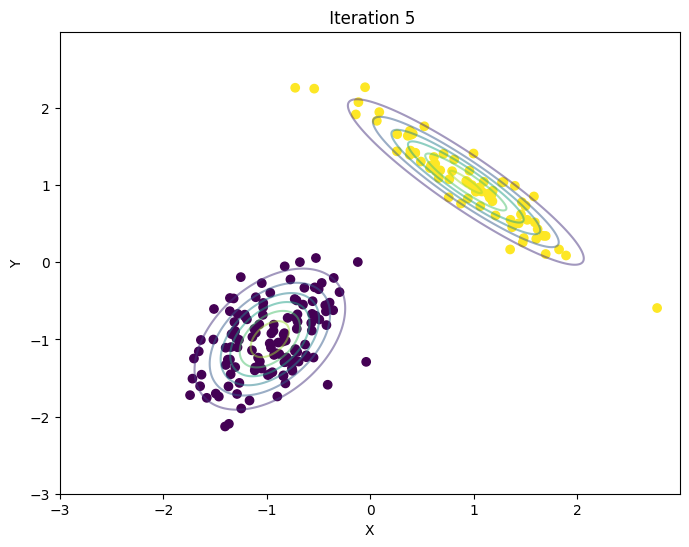

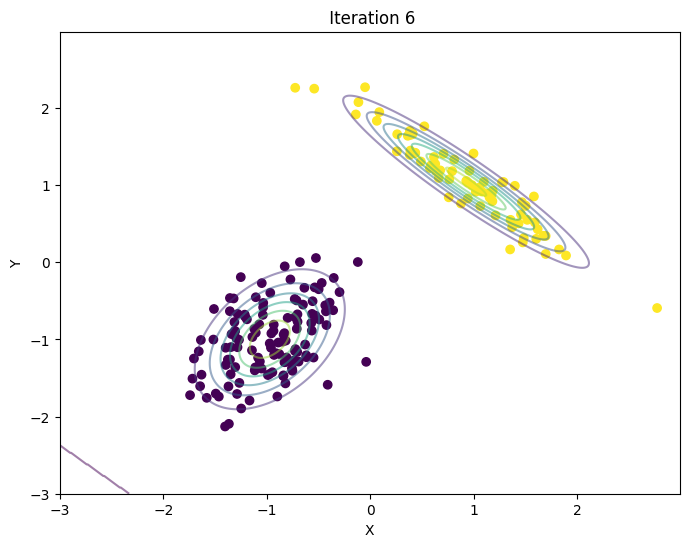

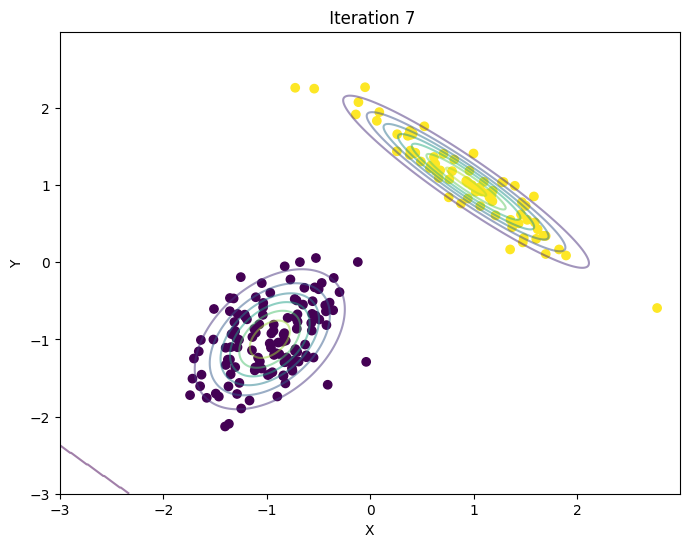

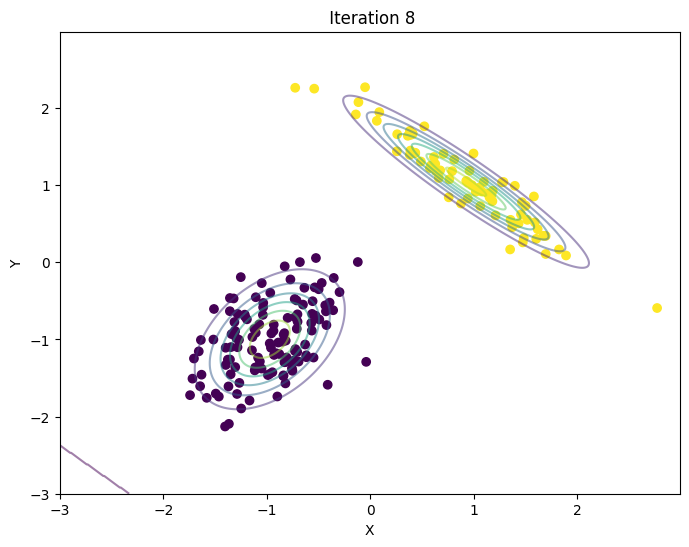

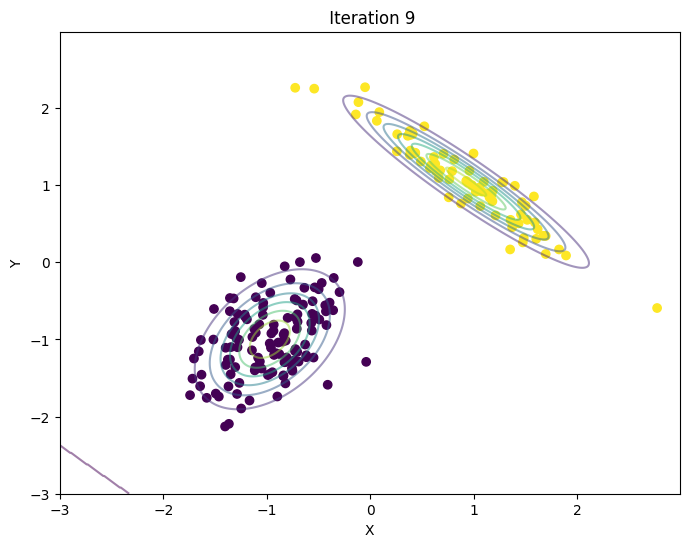

Run 4
Params:[0.5 0.5],[[ 1.22138496 -0.19284183]
 [-0.03331928 -1.5308035 ]],[[[1. 0.]
  [0. 1.]]

 [[1. 0.]
  [0. 1.]]]


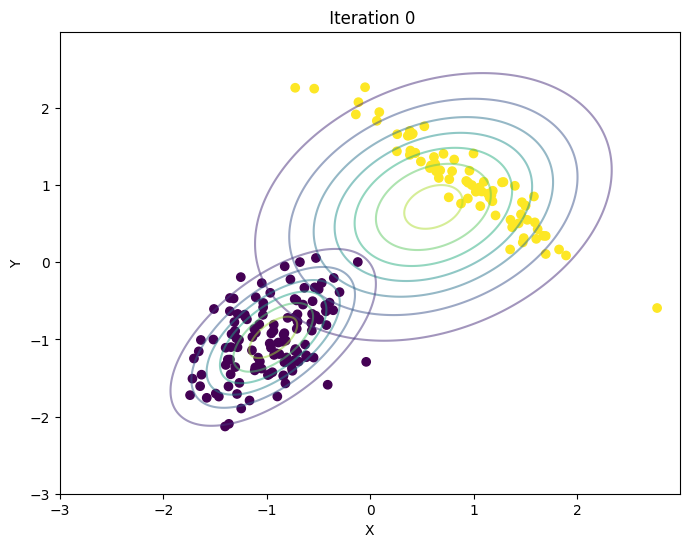

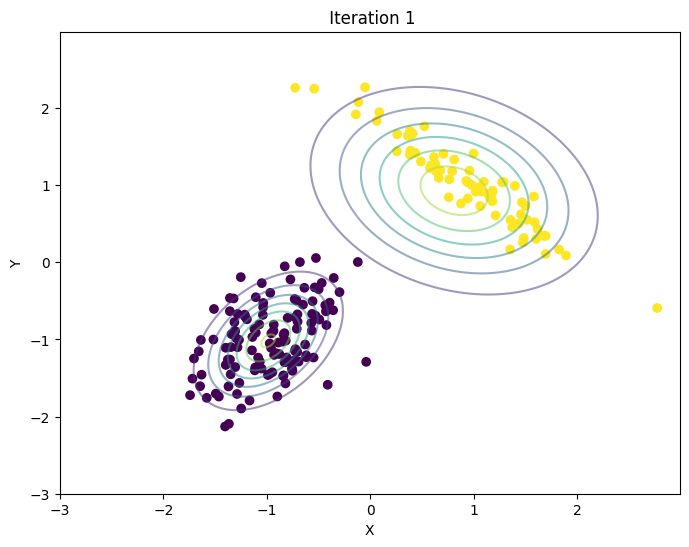

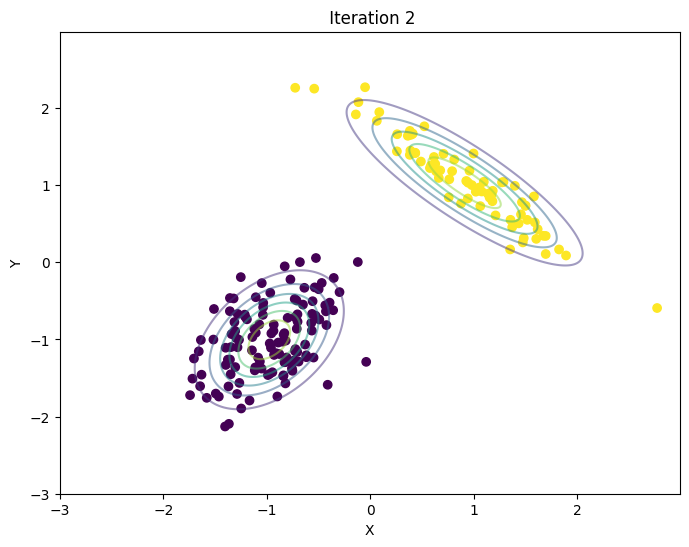

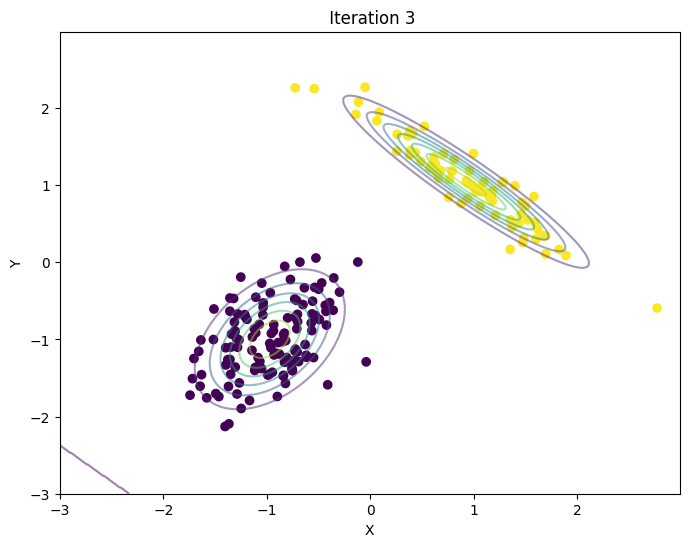

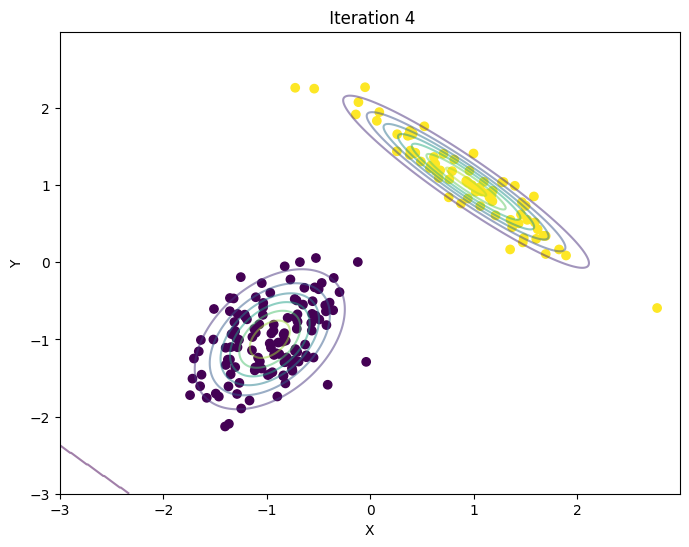

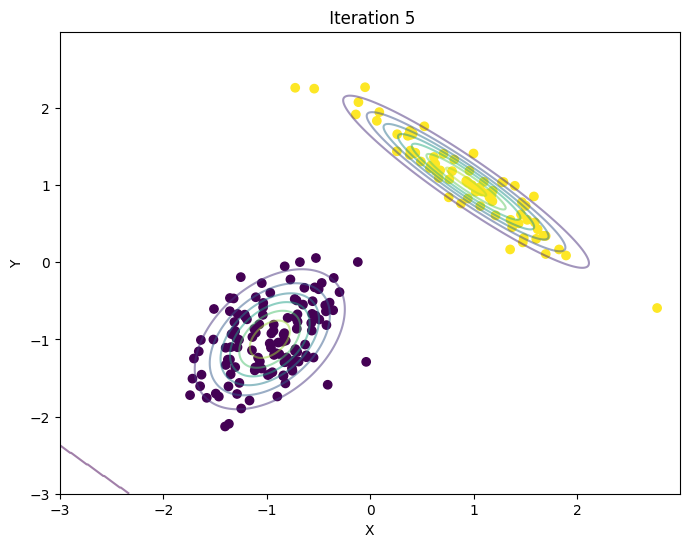

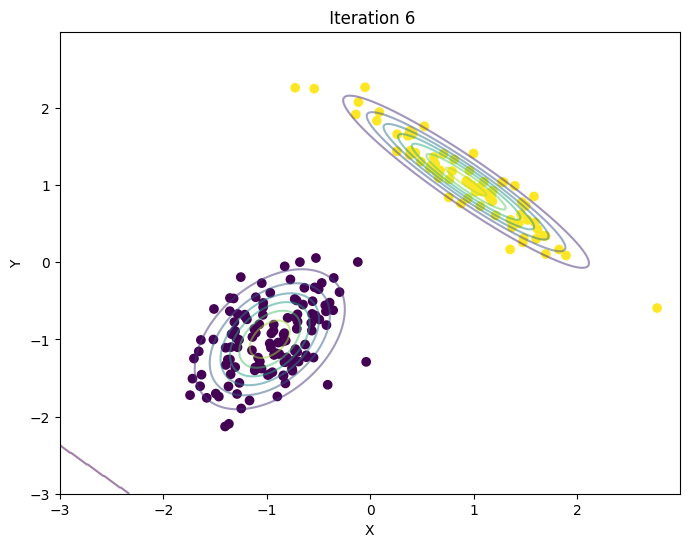

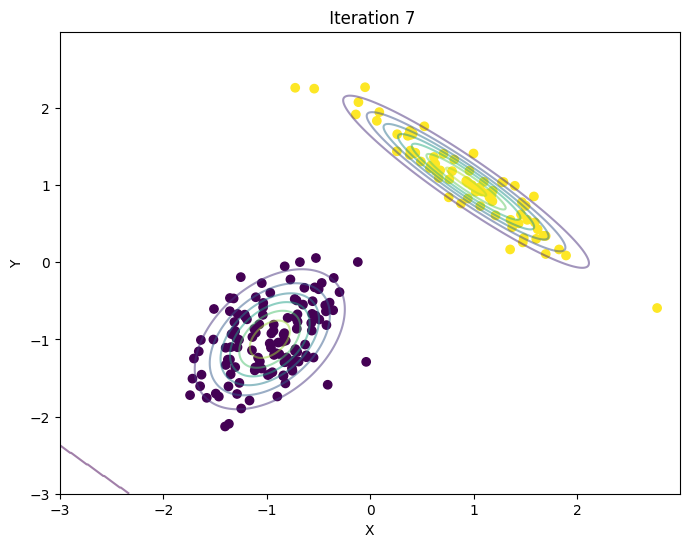

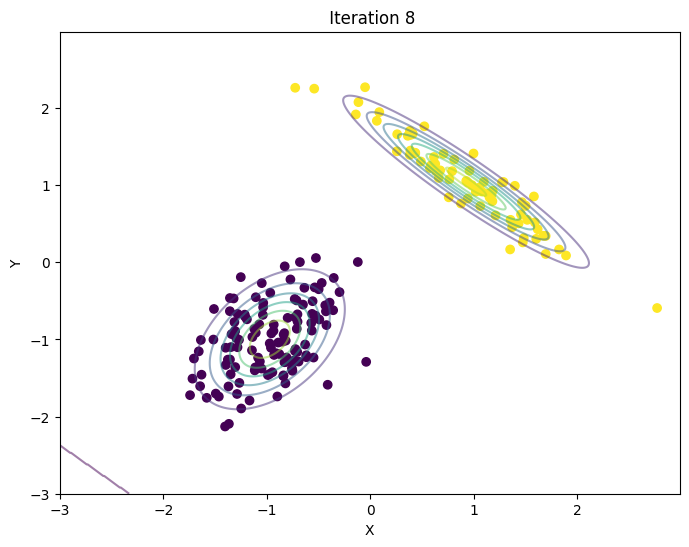

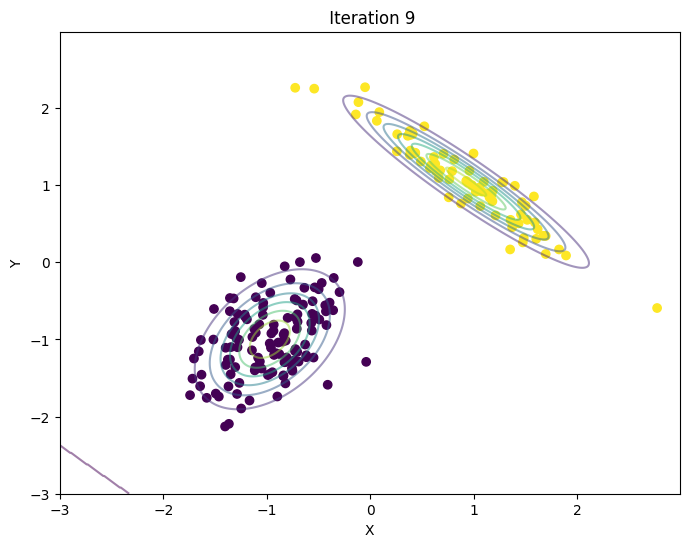

Run 5
Params:[0.5 0.5],[[0.20669051 0.53104251]
 [0.23914558 1.39789626]],[[[1. 0.]
  [0. 1.]]

 [[1. 0.]
  [0. 1.]]]


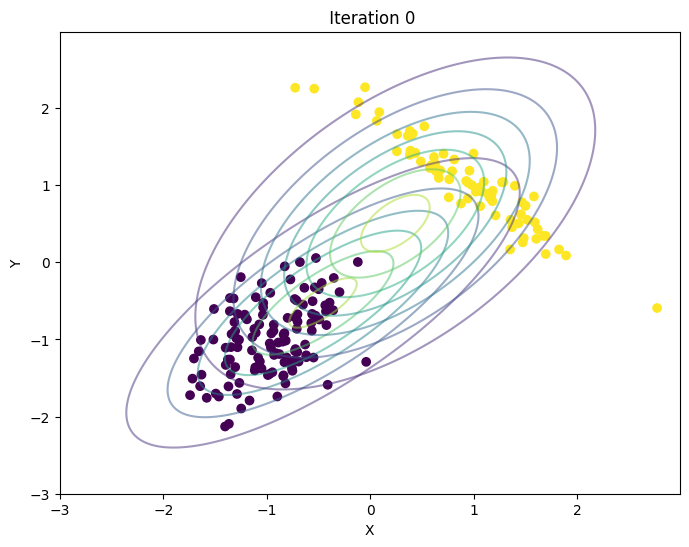

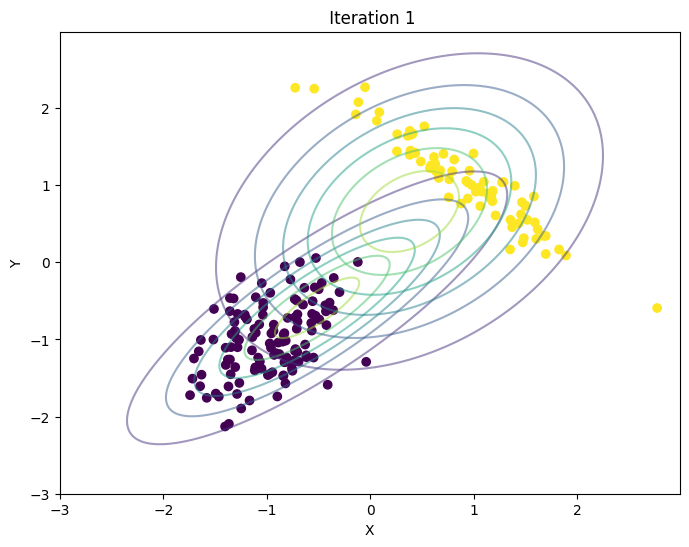

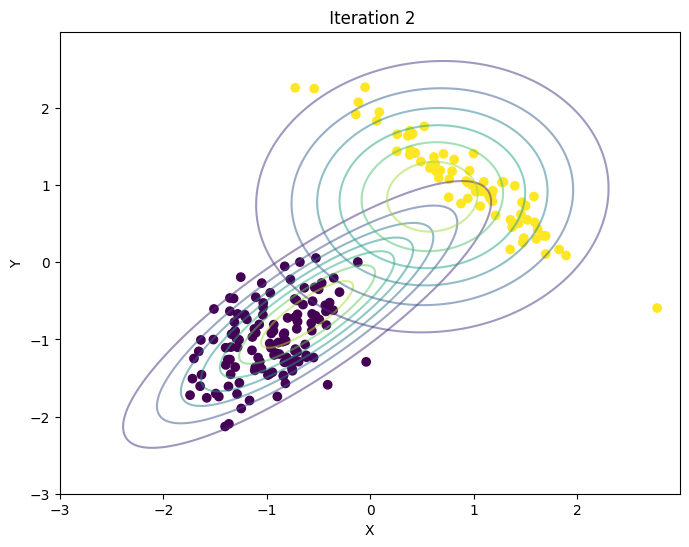

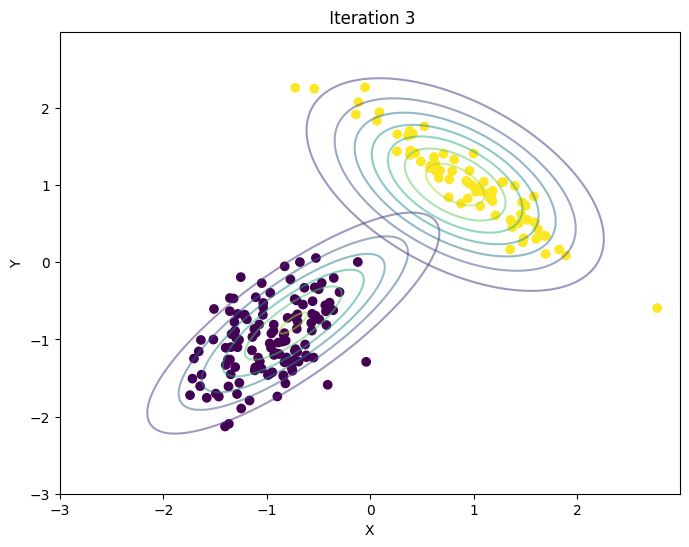

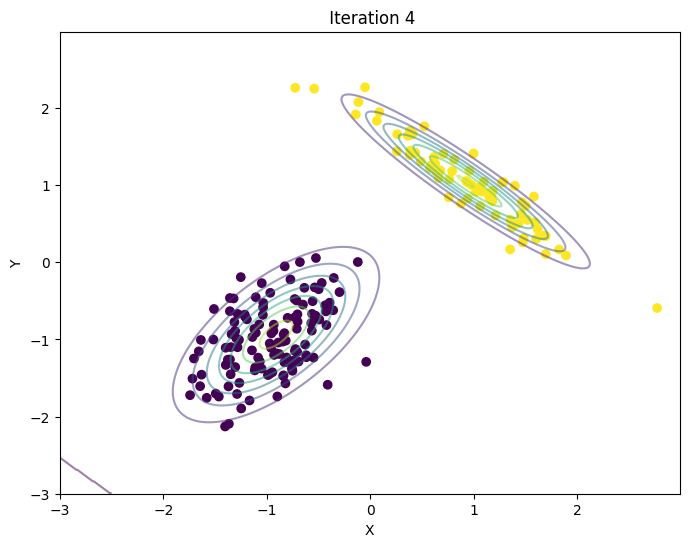

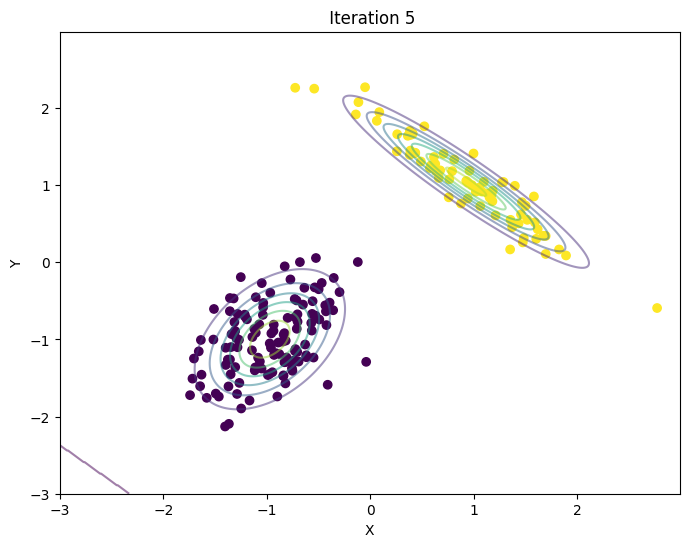

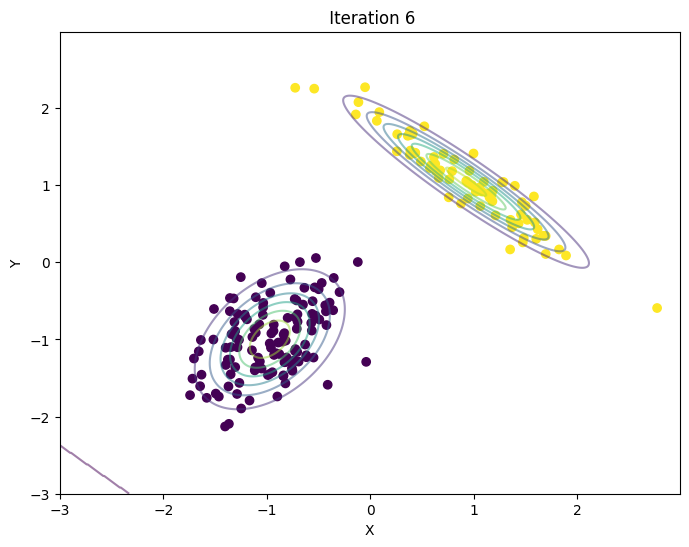

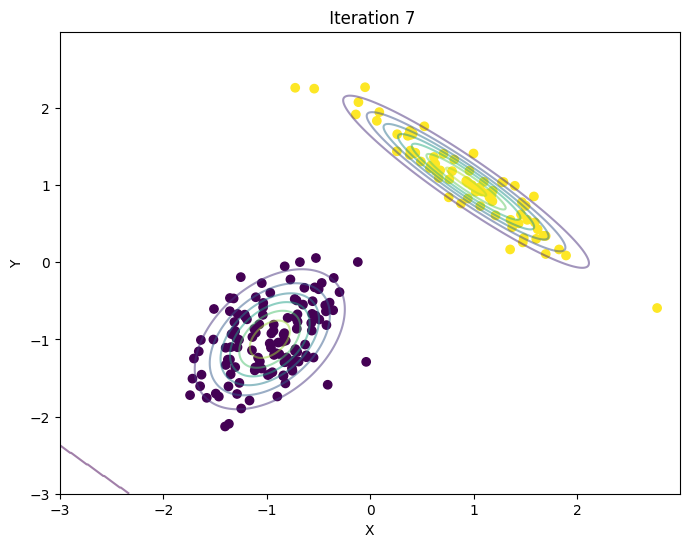

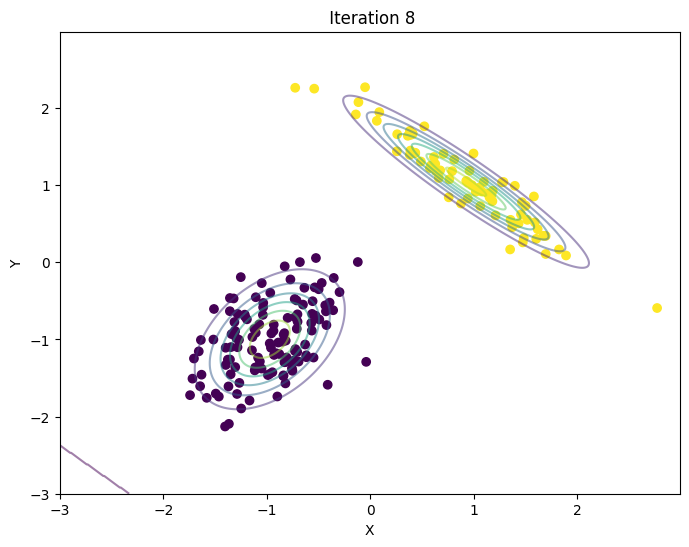

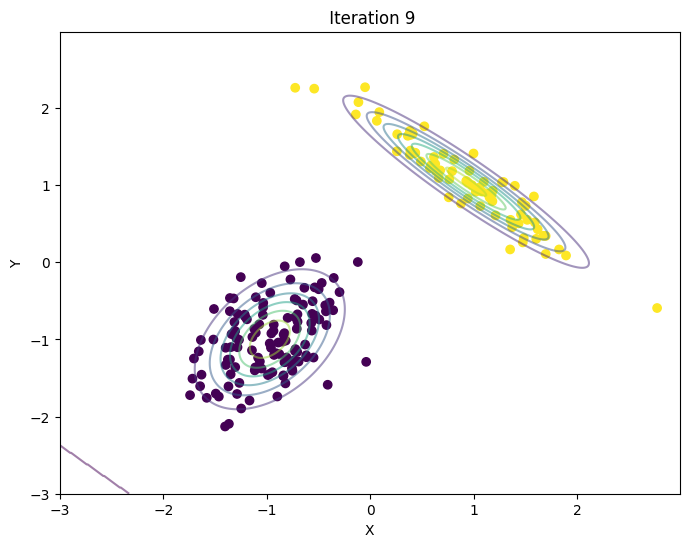

In [ ]:
def initialize_parameters(data, M):
    pi = np.ones(M) / M  # Initialize pi uniformly
    mu = np.random.randn(M, data.shape[1])  # Initialize mu randomly
    sigma = np.array([np.eye(data.shape[1]) for _ in range(M)])  # Initialize sigma as identity matrix
    return pi, mu, sigma

# Run the EM algorithm with different initializations
n_runs = 5  # Number of runs with different initializations
n_steps = 10  # Number of steps in each run
for run in range(n_runs):
    print(f"Run {run + 1}")
    # Initialize parameters
    pi, mu, sigma = initialize_parameters(data, M)
    print(f"Params:{pi},{mu},{sigma}")
    for index in range(0, nsteps, 1):

        ll = likelihood(data, pi, mu, sigma, log_likelihood=True)

        gamma = expectation(data, pi, mu, sigma)

        pi, mu, sigma = maximization(data, gamma)

        plot_contours(data, labels, pi, mu, sigma, f' Iteration {index}')



<b> Report your observations </b>

1) Insights on Convergence and Log Likelihood


Convergence Behavior: The EM algorithm progressively refines parameters towards a local maximum of the log-likelihood function, indicating improved data fit with each iteration.
Evaluation via Log Likelihood: Log-likelihood quantifies model fit, with higher values indicating better fitting models. Caution against overfitting is crucial, particularly with intricate models and sparse data.


2) Influence of Covariance Matrix Types


Flexibility of Full Covariance: Full covariance allows unique shapes, orientations, and volumes for each GMM component. Its detailed contours closely match data distribution, but the risk of overfitting escalates with more parameters to estimate.
Constraints of Spherical Covariance: Spherical covariance assumes uniform variances across all directions, simplifying parameter count and computational demands. However, it may inadequately represent elongated or oriented data distributions.
Balanced Approach with Diagonal Covariance: Diagonal covariance strikes a balance by permitting different variances along each dimension without covariance between dimensions. It provides better modeling than spherical covariance for elongated distributions but may lag behind full covariance for rotated distributions.


3)  Visualization and Model Selection Strategies


Interpretation via Contour Plots: Contour plots visualize fitted GMM components, aiding in assessing data cluster capture and overall structure.
Strategic Model Selection: Choosing an appropriate covariance structure involves balancing flexibility, overfitting risks, and computational demands. Criteria such as cross-validation and information criteria guide the selection process based on data structure and task requirements.


4)Concluding Remarks


The EM algorithm's effectiveness in GMM parameter estimation relies on initial parameter assumptions and covariance matrix structure. Making informed decisions in GMM applications necessitates balancing model complexity and flexibility, underlining the importance of thorough exploratory data analysis and model validation.
